# Coursework 1: Convolutional Neural Networks 
### Autograding
Part 1 of this coursework is autograded. This notebook comes with embedded tests which will verify that your implementations provide outputs with the appropriate types and shapes required for our hidden tests. You can run these same public tests through [LabTS](https://teaching.doc.ic.ac.uk/labts) when you have finished your work, to check that we get the same results when running these public tests.

Hidden tests will be ran after the submission deadline, and cannot be accessed :)

### Setting up working environment 

For this coursework you will need to train a large network, therefore we recommend you work with Google Colaboratory or Lab cluster, where you can access GPUs.

Please refer to the Intro lecture for getting set up on the various GPU options.

**To run the public tests within colab** you will need to copy the "tests" folder to the /content/ directory (this is the default working directory - you can also change directories with %cd). You may also need to place a copy of the CW ipynb in the /content/ directory. A better option is to mount colab on gdrive and keep the files there (so you only need to do the set up once).

#### Setup
You will need to install pytorch and other libraries by running the following cell:

<font color="orange">**The deadline for submission is Tuesday, 6 Feb by 6 pm** </font>

In [3]:
!pip install -q otter-grader pandoc torch torchvision scikit-learn seaborn

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
awscli 1.25.91 requires docutils<0.17,>=0.10, but you have docutils 0.20.1 which is incompatible.


In [67]:
# Initialization Cell
try:
    WORKING_ENV = ""  # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
    USERNAME = "your_username"  # If working on Lab Machines - Your college username
    assert WORKING_ENV in ["LABS", "COLAB", "PAPERSPACE", "SAGEMAKER"]

    if WORKING_ENV == "COLAB":
        from google.colab import drive

        %load_ext google.colab.data_table
        d1_cw1_repo_path = "Lectureship/CW/dl_cw1/"  # path in your gdrive to the repo
        content_path = f"/content/drive/MyDrive/{d1_cw1_repo_path}"  # path to gitrepo in gdrive after mounting
        drive.mount("/content/drive/")  # Outputs will be saved in your google drive

    elif WORKING_ENV == "LABS":
        content_path = (
            f"/vol/bitbucket/{USERNAME}/dl/dl_cw1/"  # You may want to change this
        )
        # Your python env and training data should be on bitbucket
        if "vol" not in content_path:
            import warnings

            warnings.warn(
                "It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues"
            )

    elif WORKING_ENV == "PAPERSPACE":  # Using Paperspace
        # Paperspace does not properly render animated progress bars
        # Strongly recommend using the JupyterLab UI instead of theirs
        !pip install ipywidgets
        content_path = "/notebooks"

    elif WORKING_ENV == "SAGEMAKER":
        content_path = "/home/studio-lab-user/sagemaker-studiolab-notebooks/"
    else:
        raise NotImplementedError()

    import os

    import otter

    if not os.path.exists(f"{content_path}tests"):
        raise ValueError("Cannot find the public tests folder")
    grader = otter.Notebook(
        f"{content_path}dl_cw_1.ipynb", tests_dir=f"{content_path}tests"
    )
    import matplotlib.pyplot as plt  # DO NOT use %matplotlib inline in the notebook
    import numpy as np

    rng_seed = 90
except:
    # This is a fallback initialization for running on LabTS. Please leave this in place before submission.
    import otter

    grader = otter.Notebook("dl_cw_1.ipynb")
    import matplotlib.pyplot as plt
    import numpy as np

    rng_seed = 90

In [89]:
import otter

grader = otter.Notebook("dl_cw_1.ipynb")
import matplotlib.pyplot as plt
import numpy as np

rng_seed = 90

## Introduction
In this courswork you will explore various deep learning functionalities through implementing a number of pytorch neural network operations/layers and creating your own deep learning model and methodology for a high dimensional classification problem.

#### Intended learning outcomes
- An understanding of the mechanics behind convolutional, pooling, linear and batch norm operations. 
- Be able to implement convolution, pooling, linear and batch norm layers from basic building blocks.
- Experience designing, implementing and optimising a classifier for a high dimensional dataset.

## Part 1 (50 points)

In this part, you will use basic Pytorch operations to define the 2D convolution, 2D max pooling, linear layer, as well as 2D batch normalization operations. Being computer scientists we care about efficiency, we therefore do not want to see any _for loops_!

**Your Task**
- Implement the forward pass for Conv2D (15 points), MaxPool2D (15 points), Linear (5 points) and BatchNorm2d (15 points)
- You are **NOT** allowed to use the torch.nn modules (The one exception is that the class inherits from nn.Module)

_hint: check out F.unfold and F.fold, they may be helpful_

In [206]:
import math

import torch
import torch.nn as nn
import torch.nn.functional as F


class Conv2d(nn.Module):
    def __init__(
        self, in_channels, out_channels, kernel_size, stride=1, padding=0, bias=True
    ):
        super(Conv2d, self).__init__()
        """
        An implementation of a convolutional layer.

        The input consists of N data points, each with C channels, height H and
        width W. We convolve each input with F different filters, where each filter
        spans all C channels and has height H' and width W'.

        Parameters:
        - w: Filter weights of shape (F, C, H', W',)
        - b: Biases of shape (F,)
        - kernel_size: Union[int, (int, int)], Size of the convolving kernel
        - stride: Union[int, (int, int)], Number of pixels between adjacent receptive fields in the
            horizontal and vertical directions.
        - padding: Union[int, (int, int)], Number of pixels that will be used to zero-pad the input.
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Define the parameters used in the forward pass
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = (
            [kernel_size, kernel_size] if isinstance(kernel_size, int) else kernel_size
        )
        self.kernel_x = self.kernel_size[0]
        self.kernel_y = self.kernel_size[1]
        self.stride = (stride, stride) if isinstance(stride, int) else stride
        self.padding = (padding, padding) if isinstance(padding, int) else padding
        self.bias = bias

        # in tuples, first element corresponds to height, 2nd to width

        # Do not initialize weights or biases with torch.empty() but rather use torch.zeros()
        # Weights should have shape [out_channels, in_channels, kernel_x, kernel_y]
        self.w = nn.Parameter(
            torch.zeros(out_channels, in_channels, self.kernel_x, self.kernel_y)
        )
        # Bias should have shape [out_channels]
        self.b = nn.Parameter(torch.zeros(out_channels)) if bias else None
        self.F = out_channels
        self.C = in_channels
        self.kernel_size = self.kernel_size
        self.stride = self.stride
        self.padding = self.padding
        ...
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, F, H', W').
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Implement the forward pass                                     #
        # weights are the kernel
        N = x.shape[0]
        H_in = x.shape[2]
        W_in = x.shape[3]
        H_out = (
            (H_in + 2 * self.padding[0] - (self.kernel_x - 1) - 1) / (self.stride[0])
        ) + 1
        W_out = (
            (H_in + 2 * self.padding[0] - (self.kernel_x - 1) - 1) / (self.stride[1])
        ) + 1
        H_out = int(H_out)
        W_out = int(W_out)

        # unfold input
        x_unfold = F.unfold(
            x, kernel_size=self.kernel_size, padding=self.padding, stride=self.stride
        )

        # reshape weights
        w_reshape = self.w.view(self.out_channels, -1)  # -1 lets pytorch infer correct
        # conv
        output = x_unfold.transpose(1, 2).matmul(w_reshape.t()).transpose(1, 2)

        # bias
        if self.b is not None:
            output += self.b.view(1, self.F, 1)

        # refold output (dunno if need the .view at end but there just to make sure its the right shape)
        out = F.fold(output, output_size=(H_out, W_out), kernel_size=(1, 1)).view(
            N, self.F, H_out, W_out
        )

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [169]:
grader.check("Convolution Layer")

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

In [208]:
my_conv2d = Conv2d(in_channels=3, out_channels=16, kernel_size=5, stride=7, padding=2)
torch_conv2d = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5, stride=7, padding=2)

# Make sure both layers use the same weights and bias
torch_conv2d.weight = nn.Parameter(my_conv2d.w.detach())
if my_conv2d.bias is not None:
    torch_conv2d.bias = nn.Parameter(my_conv2d.b.detach())

test = torch.randn(2, 3, 32, 32)

# Pass the input through both layers
my_output = my_conv2d(test)
torch_output = torch_conv2d(test)

# Check if the outputs are close
print(torch.allclose(my_output, torch_output, atol=1e-6))
#print(my_output)
#print(torch_output)
#works with torch.randn init for weights and biases

True


In [72]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class MaxPool2d(nn.Module):
    def __init__(self, kernel_size):
        super(MaxPool2d, self).__init__()
        """
        An implementation of a max-pooling layer.

        Parameters:
        - kernel_size: Union[int, (int, int)], the size of the window to take a max over
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        ...
        self.kernel_size = (
            [kernel_size, kernel_size] if isinstance(kernel_size, int) else kernel_size
        )
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, C, H', W').
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        H_in = x.shape[2]
        W_in = x.shape[3]

        H_out = (H_in - self.kernel_size[0]) // self.kernel_size[0] + 1
        W_out = (W_in - self.kernel_size[1]) // self.kernel_size[1] + 1

        x_unfold = F.unfold(
            x, kernel_size=self.kernel_size, stride=self.kernel_size, padding=0
        )

        # Reshape and take max along windows
        max_values = x_unfold.view(
            x.shape[0], x.shape[1], self.kernel_size[0] * self.kernel_size[1], -1
        ).max(dim=2)[
            0
        ]  # idk last dim but -1 fills in

        out = max_values.view(x.shape[0], x.shape[1], H_out, W_out)

        # *****END OF YOUR CODE*****

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [96]:
grader.check("MaxPool Layer")

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed

In [162]:
my_maxpool2d = MaxPool2d(kernel_size=2)
torch_maxpool2d = nn.MaxPool2d(kernel_size=2)

pooltest = torch.randn(1, 3, 32, 32)

my_output = my_maxpool2d(pooltest)
torch_output = torch_maxpool2d(pooltest)

# Check if the outputs are close
print(torch.allclose(my_output, torch_output, atol=1e-6))

True


In [160]:
class Linear(nn.Module):
    def __init__(self, in_channels, out_channels, bias=True):
        super(Linear, self).__init__()
        """
        An implementation of a Linear layer.

        Parameters:
        - weight: the learnable weights of the module of shape (in_channels, out_channels).
        - bias: the learnable bias of the module of shape (out_channels).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.bias = bias

        # self.register_parameter is not used as it was mentioned on piazza
        # that this will be overridden
        # Also no initialisation methods for this reason
        self.w = nn.Parameter(torch.zeros(out_channels, in_channels))
        self.b = nn.Parameter(torch.zeros(out_channels)) if bias else None
        ...
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, *, H) where * means any number of additional
        dimensions and H = in_channels
        Output:
        - out: Output data of shape (N, *, H') where * means any number of additional
        dimensions and H' = out_channels
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        N = x.shape[0]
        # w = out x in
        # b = out x 1
        # x = N x ... x in

        out = torch.matmul(x, self.w.t())
        out += self.b if self.b is not None else out

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [158]:
grader.check("Linear Layer")

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

In [159]:
my_linear = Linear(in_channels=10, out_channels=5)
torch_linear = nn.Linear(in_features=10, out_features=5)

# Make sure both layers use the same weights and bias
torch_linear.weight = nn.Parameter(my_linear.w.detach())
if my_linear.b is not None:
    torch_linear.bias = nn.Parameter(my_linear.b.detach())

lineartest = torch.randn(1, 10)

# Pass the input through both layers
my_output = my_linear(lineartest)
torch_output = torch_linear(lineartest)

print(torch.allclose(my_output, torch_output, atol=1e-6))
print(my_output)
print(torch_output)
#tested with w and b init with torch.randn

True
tensor([[-2.8295,  3.0362,  1.1225,  1.7628,  0.3776]], grad_fn=<AddBackward0>)
tensor([[-2.8295,  3.0362,  1.1225,  1.7628,  0.3776]],
       grad_fn=<AddmmBackward0>)


In [216]:
class BatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-05, momentum=0.1):
        super(BatchNorm2d, self).__init__()
        """
		An implementation of a Batch Normalization over a mini-batch of 2D inputs.

		The mean and standard-deviation are calculated per-dimension over the
		mini-batches and gamma and beta are learnable parameter vectors of
		size num_features.

		Parameters:
		- num_features: C from an expected input of size (N, C, H, W).
		- eps: a value added to the denominator for numerical stability. Default: 1e-5
		- momentum: the value used for the running_mean and running_var
		computation. Default: 0.1 . (i.e. 1-momentum for running mean)
		- gamma: the learnable weights of shape (num_features).
		- beta: the learnable bias of the module of shape (num_features).
		"""
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum

        # self.register_parameter is not used as it was mentioned on piazza
        # that this will be overridden
        self.gamma = torch.zeros(num_features)
        self.beta = torch.zeros(num_features)
        self.running_mean = torch.zeros(num_features)
        self.running_var = torch.zeros(num_features) #torch initializes mean=0 and var=1
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        During training this layer keeps running estimates of its computed mean and
        variance, which are then used for normalization during evaluation.
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data of shape (N, C, H, W) (same shape as input)
        """
        # TODO: Implement the forward pass                                     #
        #       (be aware of the difference for training and testing)          #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        mean = x.mean([0, 2, 3])
        var_bias = x.var([0, 2, 3], unbiased=False)
        var_unbias = x.var([0, 2, 3], unbiased=True)
        
        if self.training:
            var = var_bias
            with torch.no_grad():
                self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
                self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var_unbias 

        else:
            mean = self.running_mean
            var = self.running_var

        gamma = self.gamma.view(1, -1, 1, 1)
        beta = self.beta.view(1, -1, 1, 1)
        
        x = ((x - mean[None, :, None, None]) / torch.sqrt(var[None, :, None, None] + self.eps))*gamma + beta #on pytorch website it uses gamma and beta here
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return x

In [92]:
grader.check("BatchNorm Layer")

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

In [218]:
my_bn2d = BatchNorm2d(num_features=2)
torch_bn2d = nn.BatchNorm2d(num_features=2)

torch_bn2d.weight = nn.Parameter(my_bn2d.gamma.detach())
torch_bn2d.bias = nn.Parameter(my_bn2d.beta.detach())

test_batch = torch.randn(4, 2, 23, 32)

# Test in training mode
my_bn2d.training = True
torch_bn2d.train()
my_output = my_bn2d(test_batch)
torch_output = torch_bn2d(test_batch)
print("Training mode:", torch.allclose(my_output, torch_output, atol=1e-6))
#print(my_output)
#print(torch_output)

# Test in evaluation mode
my_bn2d.training = False
torch_bn2d.eval()
my_output = my_bn2d(test_batch)
torch_output = torch_bn2d(test_batch)
print("Evaluation mode:", torch.allclose(my_output, torch_output, atol=1e-6))

#works with gamma&beta init with ones, runningmean = 0 and runningvar = 1. torch inits mean and var with 0 and 1.

Training mode: True
Evaluation mode: True


## Part 2 (40 points)

In this part, you will design, train and optimise a custom deep learning model for classifying a specially selected subset of Imagenet. Termed NaturalImageNet, it is made up of a hand selected subset of the famous ImageNet dataset. The dataset contains 20 classes, all animals from the natural world. We hope that this dataset will be fun to work with but also a challenge.

You will be marked on your experimental process, methods implemented and your reasoning behind your decisions. While there will be marks for exceeding a baseline performance score we stress that students should **NOT** spend excessive amounts of time optimising performance to silly levels.

We have given you some starter code, please feel free to use and adapt it.

**Your Task**
1. Develop/adapt a deep learning pipeline to maximise performance on the test set. (28 points)
    * 8 points will be awarded for improving on the baseline score on the test set. Don't worry you can get full marks here by improving by a minor amount.
    * 20 points will be awarded for the adaptations made to the baseline model and pipeline.

2. Answer the qualititative questions (12 points)

In [4]:
!pip install albumentations
!pip install pytorch_warmup


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


**Downloading NaturalImageNet**

In [8]:
ON_COLAB = False

!wget https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
!wget https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
if ON_COLAB:
    !unzip /content/NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip /content/NaturalImageNetTrain.zip?download=1 > /dev/null
else: 
    !unzip NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip NaturalImageNetTrain.zip?download=1 > /dev/null

--2024-01-27 17:47:19--  https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.98.238, 188.185.79.172, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.184.98.238|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/5846979/files/NaturalImageNetTest.zip [following]
--2024-01-27 17:47:19--  https://zenodo.org/records/5846979/files/NaturalImageNetTest.zip
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 138507970 (132M) [application/octet-stream]
Saving to: ‘NaturalImageNetTest.zip?download=1.1’

NetTest.zip?downloa  59%[==========>         ]  78.22M  17.7MB/s    eta 4s     ^C
--2024-01-27 17:47:26--  https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.103.159, 188.184.98.238, 188.185.79.172, ...
Connecting to zenodo.org (zenodo.org)|188.184.1

In [1]:
# torch
# other
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.nn import Conv2d, MaxPool2d
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import make_grid, save_image
import albumentations as A
from albumentations.pytorch import ToTensorV2
from collections import Counter
import os
import shutil
from PIL import Image
import random
import pickle
import seaborn as sns
import pandas as pd
import pytorch_warmup as warmup



# set the seed for reproducibility
rng_seed = 90
torch.manual_seed(rng_seed)
random.seed(rng_seed)

ON_COLAB = False


In [2]:
# When we import the images we want to first convert them to a tensor.
# It is also common in deep learning to normalise the the inputs. This
# helps with stability.
# To read more about this subject this article is a great one:
# https://towardsdatascience.com/understand-data-normalization-in-machine-learning-8ff3062101f0

# transforms is a useful pytorch package which contains a range of functions
# for preprocessing data, for example applying data augmentation to images
# (random rotations, blurring the image, randomly cropping the image). To find out
# more please refer to the pytorch documentation:
# https://pytorch.org/docs/stable/torchvision/transforms.html

mean = torch.Tensor([0.485, 0.456, 0.406])
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean.tolist(), std.tolist()),
    ]
)
train_path = ("/content/" if ON_COLAB else "") + "NaturalImageNetTrain"
test_path = ("/content/" if ON_COLAB else "") + "NaturalImageNetTest"

augmented_train_path = train_path + "_augmented"
if os.path.exists(augmented_train_path):    
    shutil.rmtree(augmented_train_path)
shutil.copytree(train_path, augmented_train_path)

#data augmentation
#aim for min class size of 1000. if class size under this then augment to this size.
#transformations: realistic ones, not too extreme.     
train_transform = A.Compose([
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
    A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.4),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.ISONoise(p=0.2),
    A.Defocus(p=0.2),
    A.MotionBlur(p=0.2),
    A.RandomShadow(p=0.1), 
    #ToTensorV2(),
])

number_to_add = []
train_dataset = datasets.ImageFolder(train_path, transform=transform)
train_labels = train_dataset.targets
class_counts = Counter(train_labels)
class_counts = np.array([count for _, count in class_counts.items()]) #no images in each class
class_names = {k: v for k, v in train_dataset.class_to_idx.items()}
target_class_size = 1200
number_to_add = [(target_class_size - count) if count < target_class_size else (target_class_size - count) for count in class_counts] #how many images to add/remove from each class
class_names = {k: number_to_add[i] for i, (k, v) in enumerate(train_dataset.class_to_idx.items())} #dict of class names and how many images to add to each class
print(class_names)

#go through each class and augmented images to take classes up to 1000
for class_idx, class_dir in enumerate(os.listdir(augmented_train_path)):
    if class_dir not in list(class_names.keys()):
        print(class_dir, "not in class_names")
        continue
     
    if class_names[class_dir] > 0: #add images
        image_files = os.listdir(os.path.join(augmented_train_path, class_dir))
        img_files_copy = image_files.copy()
        print(class_dir, len(image_files), "images originally - adding", class_names[class_dir], "images")
        for i in range(class_names[class_dir]):
            if len(image_files) == 0:
                image_files = img_files_copy
            image_file = np.random.choice(image_files)
            image_files.remove(image_file)  # Remove the chosen image from the list
            image_path = os.path.join(augmented_train_path, class_dir, image_file)
            image = Image.open(image_path)
            try: #if a non rgb image is fed to rgb shift, it gives error
                transformed = train_transform(image=np.array(image))
                new_image_path = os.path.join(augmented_train_path, class_dir, f"aug{i+1}_{image_file}")
                transformed_image = Image.fromarray(transformed["image"])
                transformed_image.save(new_image_path)
            except Exception as ex:
                print("transformation error: ", image_path, image_file, ex)
                continue
    else: #remove till at target class size
        image_files = os.listdir(os.path.join(augmented_train_path, class_dir))
        print(class_dir, len(image_files), "images originally - removing", abs(class_names[class_dir]), "images")
        for i in range(abs(class_names[class_dir])):
            image_file = np.random.choice(image_files)
            os.remove(os.path.join(augmented_train_path, class_dir, image_file))
            image_files.remove(image_file)

            
    
#do normalisations after augmentation
train_dataset = datasets.ImageFolder(augmented_train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)


# Create train val split
n = len(train_dataset)
n_val = int(n / 10)

train_set, val_set = torch.utils.data.random_split(train_dataset, [n - n_val, n_val])


print(len(train_set), len(val_set), len(test_dataset))


# The number of images to process in one go. If you run out of GPU
# memory reduce this number!
batch_size = 128

# Dataloaders are a great pytorch functionality for feeding data into our AI models.
# see https://pytorch.org/docs/stable/data.html?highlight=dataloader#torch.utils.data.DataLoader
# for more info.

loader_train = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_val = DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_test = DataLoader(
    test_dataset, batch_size=batch_size, shuffle=True, num_workers=2
)

{'African elephant': -171, 'Eurasiankingfisher': 468, 'Virginia deer': 365, 'brown bear': 652, 'chameleon': 453, 'dragonfly': -24, 'giant panda': -164, 'gorilla': 89, 'hawk': -7, 'king penguin': 244, 'koala': -399, 'ladybug': -215, 'lion': 309, 'meerkat': -238, 'orangutan': 277, 'peacock': 284, 'red fox': 774, 'snail': 182, 'tiger': 449, 'white rhinoceros': 688}
gorilla 1111 images originally - adding 89 images
ladybug 1415 images originally - removing 215 images
dragonfly 1224 images originally - removing 24 images
snail 1018 images originally - adding 182 images
transformation error:  NaturalImageNetTrain_augmented/snail/26539528_1697727ef8.jpg 26539528_1697727ef8.jpg RGBShift transformation expects 3-channel images.
transformation error:  NaturalImageNetTrain_augmented/snail/1261963596_0863b11f83.jpg 1261963596_0863b11f83.jpg Image must be RGB
.DS_Store not in class_names
African elephant 1371 images originally - removing 171 images
orangutan 923 images originally - adding 277 image

In [3]:
#check number of images in each class
train_labels = train_dataset.targets
class_counts = Counter(train_labels)
class_names = {v: k for k, v in train_dataset.class_to_idx.items()}
for class_id, count in class_counts.items():
    print(f"{class_names[class_id]}: {count}")



#find class weights
class_to_idx = train_dataset.class_to_idx.items()
class_counts = np.array([count for _, count in class_counts.items()])
class_weights = 1/class_counts
class_weights = torch.from_numpy(class_weights)
print(class_weights)

African elephant: 1200
Eurasiankingfisher: 1200
Virginia deer: 1200
brown bear: 1200
chameleon: 1199
dragonfly: 1200
giant panda: 1200
gorilla: 1200
hawk: 1200
king penguin: 1200
koala: 1200
ladybug: 1200
lion: 1200
meerkat: 1200
orangutan: 1199
peacock: 1200
red fox: 1200
snail: 1198
tiger: 1200
white rhinoceros: 1196
tensor([0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008,
        0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008,
        0.0008, 0.0008], dtype=torch.float64)


In [4]:
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())


def denorm(x):
    """
    Function to reverse the normalization so that we can visualise the outputs
    """
    x = unnormalize(x)
    x = x.view(x.size(0), 3, 256, 256)
    return x


def show(img):
    """
    function to visualise tensors
    """
    #ive changed this to MPS, change back to CUDA
    #if torch.cuda.is_available():
    if torch.backends.mps.is_available():
        img = img.cpu()
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)).clip(0, 1))

**Visualising some example images** 

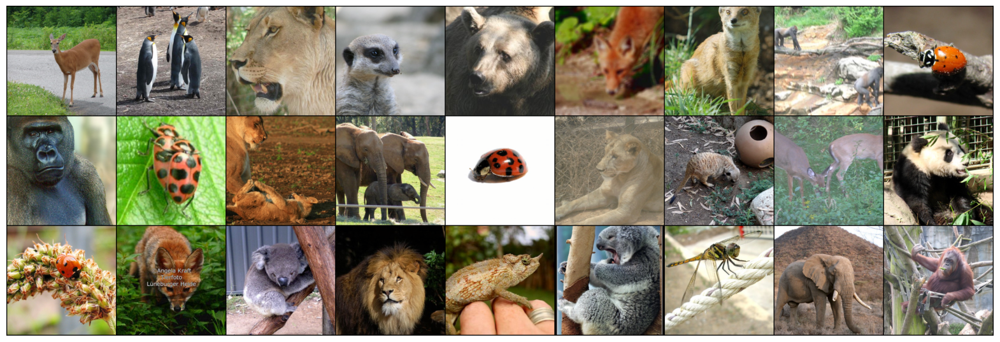

In [9]:
sample_inputs, _ = next(iter(loader_val))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(
    denorm(fixed_input),
    nrow=9,
    padding=2,
    normalize=False,
    value_range=None,
    scale_each=False,
    pad_value=0,
)
plt.figure(figsize=(20, 10))
plt.axis("off")
show(img)

Next, we define ResNet-18:

In [5]:
# define resnet building blocks


class ResidualBlock(nn.Module):
    def __init__(self, inchannel, outchannel, stride=1, alpha=1.0):
        super(ResidualBlock, self).__init__()

        self.left = nn.Sequential(
            Conv2d(
                inchannel,
                outchannel,
                kernel_size=3,
                stride=stride,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(outchannel),
            nn.CELU(inplace=True, alpha=alpha),
#            nn.Dropout(0.1),
            Conv2d(
                outchannel, outchannel, kernel_size=3, stride=1, padding=1, bias=False
            ),
            nn.BatchNorm2d(outchannel),
        )

        self.shortcut = nn.Sequential()

        if stride != 1 or inchannel != outchannel:
            self.shortcut = nn.Sequential(
                Conv2d(
                    inchannel,
                    outchannel,
                    kernel_size=1,
                    stride=stride,
                    padding=0,
                    bias=False,
                ),
                nn.BatchNorm2d(outchannel),
            )

    def forward(self, x):
        out = self.left(x)

        out += self.shortcut(x)

        out = F.relu(out)

        return out


# define resnet


class ResNet(nn.Module):
    def __init__(self, ResidualBlock, num_classes=20, alpha=1.0):
        super(ResNet, self).__init__()

        self.inchannel = 16
        self.conv1 = nn.Sequential(
            Conv2d(3, 16, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(),
        )

        self.layer1 = self.make_layer(ResidualBlock, 16, 2, stride=2, alpha=alpha)
        self.layer2 = self.make_layer(ResidualBlock, 32, 2, stride=2, alpha=alpha)
        self.layer3 = self.make_layer(ResidualBlock, 64, 2, stride=2, alpha=alpha)
        self.layer4 = self.make_layer(ResidualBlock, 128, 2, stride=2, alpha=alpha)
        self.layer5 = self.make_layer(ResidualBlock, 256, 2, stride=2, alpha=alpha)
        self.layer6 = self.make_layer(ResidualBlock, 512, 2, stride=2, alpha=alpha)
        self.maxpool = MaxPool2d(4)
        self.fc = nn.Linear(512, num_classes)

    def make_layer(self, block, channels, num_blocks, stride, alpha):
        strides = [stride] + [1] * (num_blocks - 1)

        layers = []

        for stride in strides:
            layers.append(block(self.inchannel, channels, stride, alpha=alpha))

            self.inchannel = channels

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x


# please do not change the name of this class
def MyResNet(alpha=1.0):
    return ResNet(ResidualBlock, alpha=alpha)

In [6]:
import seaborn as sns
from sklearn.metrics import confusion_matrix


def confusion(preds, y, plot=True):
    labels = [
        "African Elephant",
        "Kingfisher",
        "Deer",
        "Brown Bear",
        "Chameleon",
        "Dragonfly",
        "Giant Panda",
        "Gorilla",
        "Hawk",
        "King Penguin",
        "Koala",
        "Ladybug",
        "Lion",
        "Meerkat",
        "Orangutan",
        "Peacock",
        "Red Fox",
        "Snail",
        "Tiger",
        "White Rhino",
    ]
    # Plotting the confusion matrix
    if plot:
        cm = confusion_matrix(y.cpu().numpy(), preds.cpu().numpy(), normalize="true")
        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        sns.heatmap(cm, annot=True, ax=ax)
        # annot=True to annotate cells

        # labels, title and ticks
        ax.set_xlabel("Predicted labels")
        ax.set_ylabel("True labels")
        ax.set_title("Confusion Matrix")
        ax.xaxis.set_ticklabels(labels, rotation=70)
        ax.yaxis.set_ticklabels(labels, rotation=0)
        plt.show()
    
        #calculate precision and recall
        precision = []
        recall = []

        for i in range(len(labels)):
            tp = cm[i][i]
            fp = sum(cm[:, i]) - tp
            fn = sum(cm[i, :]) - tp
            precision.append(tp/(tp+fp))
            recall.append(tp/(tp+fn))
        
        #f1 score
        f1 = [2*(precision[i]*recall[i])/(precision[i]+recall[i]) for i in range(len(labels))]

        #precision = [str(labels[i])+str(": ")+str(precision[i]) for i in range(len(labels))]
        #recall = [str(labels[i])+str(": ")+str(recall[i]) for i in range(len(labels))]
        #f1 = [str(labels[i])+str(": ")+str(f1[i]) for i in range(len(labels))]

        eval_df = pd.DataFrame({"labels": labels, "precision": precision, "recall": recall, "f1": f1})

        print(eval_df)      


def incorrect_preds(preds, y, test_img, plot=True):
    labels = [
        "African Elephant",
        "Kingfisher",
        "Deer",
        "Brown Bear",
        "Chameleon",
        "Dragonfly",
        "Giant Panda",
        "Gorilla",
        "Hawk",
        "King Penguin",
        "Koala",
        "Ladybug",
        "Lion",
        "Meerkat",
        "Orangutan",
        "Peacock",
        "Red Fox",
        "Snail",
        "Tiger",
        "White Rhino",
    ]
    # lets see a sample of the images which were classified incorrectly!
    if plot:
        correct = (preds == y).float()
        test_labels_check = correct.cpu().numpy()
        incorrect_indexes = np.where(test_labels_check == 0)

        test_img = test_img.cpu()
        samples = make_grid(
            denorm(test_img[incorrect_indexes][:9]),
            nrow=3,
            padding=2,
            normalize=False,
            value_range=None,
            scale_each=False,
            pad_value=0,
        )
        plt.figure(figsize=(20, 10))
        plt.title("Incorrectly Classified Instances")
        show(samples)
        labels = np.asarray(labels)
        print("Predicted label", labels[preds[incorrect_indexes].cpu().numpy()[:9]])
        print("True label", labels[y[incorrect_indexes].cpu().numpy()[:9]])
        print("Corresponding images are shown below")

In [7]:
USE_GPU = True
dtype = torch.float32


#if USE_GPU and torch.cuda.is_available():
if USE_GPU and torch.backends.mps.is_available():
    #device = torch.device("cuda:0")
    device = torch.device("mps")
    class_weights = class_weights.to(device=device, dtype=dtype)
else:
    device = torch.device("cpu")

print(device)


print_every = 10


def check_accuracy(loader, model, analysis=False, plot=True):
    # function for test accuracy on validation and test set

    num_correct = 0
    num_samples = 0
    total_loss = 0
    model.eval()  # set model to evaluation mode
    with torch.no_grad():
        for t, (x, y) in enumerate(loader):
            x = x.to(device=device, dtype=dtype)  # move to device
            y = y.to(device=device, dtype=torch.long)
            scores = model(x)
            loss = F.cross_entropy(scores, y)
            #loss = F.cross_entropy(scores, y, weight=class_weights)
            total_loss += loss.item()
            _, preds = scores.max(1)
            num_correct += (preds == y).sum()
            num_samples += preds.size(0)
            if t == 0 and analysis:
                stack_labels = y
                stack_predicts = preds
            elif analysis:
                stack_labels = torch.cat([stack_labels, y], 0)
                stack_predicts = torch.cat([stack_predicts, preds], 0)
        acc = float(num_correct) / num_samples
        avg_loss = total_loss / len(loader)
        print(
            "Got %d / %d correct of val set (%.2f)"
            % (num_correct, num_samples, 100 * acc)
        )
        print("Avg val loss: ", avg_loss)
        if analysis:
            print("check acc", type(stack_predicts), type(stack_labels))
            confusion(stack_predicts, stack_labels, plot=plot)
            incorrect_preds(preds, y, x, plot=plot)
        return float(acc), avg_loss


def train_part(model, optimizer, epochs=1, print_info=True, print_every=1, warmup_period=504):
    """
    Train a model on NaturalImageNet using the PyTorch Module API.

    Inputs:
    - model: A PyTorch Module giving the model to train.
    - optimizer: An Optimizer object we will use to train the model
    - epochs: (Optional) A Python integer giving the number of epochs to train for

    Returns: Nothing, but prints model accuracies during training.
    """
    model = model.to(device=device)  # move the model parameters to CPU/GPU

    train_losses = []
    val_accur = []
    val_losses = []

    #early stopping
    best_val_acc = 0 
    best_val_loss = float("inf")
    epoch_buffer = []

    #warmup

    warmup_period = warmup_period #168 in each epoch
    num_steps = len(loader_train) * epochs - warmup_period #for lr scheduler

    warmup_scheduler = warmup.LinearWarmup(optimizer, warmup_period=warmup_period)

    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_steps)
    #lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=330)
    #lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2, verbose=True)

    for e in range(epochs):
        curr_train_loss = 0
        for t, (x, y) in enumerate(loader_train):
            model.train()  # put model to training mode
            x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
            y = y.to(device=device, dtype=torch.long)
            scores = model(x)
            loss = F.cross_entropy(scores, y)

            # Zero out all of the gradients for the variables which the optimizer
            # will update.
            optimizer.zero_grad()

            loss.backward()

            # Update the parameters of the model using the gradients
            optimizer.step()
            if t % 10 ==0:
                print("lr: ", optimizer.param_groups[-1]['lr'])

            with warmup_scheduler.dampening():
                if warmup_scheduler.last_step + 1 >= warmup_period: #wait for warmup before lr scheduler
                    lr_scheduler.step()

            if t % print_every == 0 and print_info:
                print("Epoch: %d, Iteration %d, loss = %.4f" % (e, t, loss.item()))
            curr_train_loss += loss.item()
        train_losses.append(curr_train_loss / len(loader_train)) #avg train loss for epoch     
        val_acc, val_loss = check_accuracy(loader_val, model)
        val_accur.append(val_acc) #val acc for epoch
        val_losses.append(val_loss)        

        best_val_loss = min(best_val_loss, val_loss)
        epoch_buffer.append(val_loss)
        if len(epoch_buffer) > 4:  # buffer of last n epochs
            epoch_buffer.pop(0)
            if all(curr_loss > best_val_loss for curr_loss in epoch_buffer):
                print(f"Early stopping at epoch {e}")
                #revert to best params

                return train_losses, val_accur, val_losses
        

        
    
    return train_losses, val_accur, val_losses

mps


lr: 0.0031030912029743943, weight_decay: 1.710754268173738e-05, warmup: 1276
lr:  2.431889657503444e-06
Epoch: 0, Iteration 0, loss = 4.6117
lr:  2.6750786232537883e-05
lr:  5.106968280757232e-05
lr:  7.538857938260676e-05
Epoch: 0, Iteration 30, loss = 3.0165
lr:  9.97074759576412e-05
lr:  0.00012402637253267564
lr:  0.00014834526910771008
Epoch: 0, Iteration 60, loss = 2.7633
lr:  0.00017266416568274451
lr:  0.00019698306225777895
lr:  0.0002213019588328134
Epoch: 0, Iteration 90, loss = 2.5238
lr:  0.0002456208554078478
lr:  0.00026993975198288223
lr:  0.00029425864855791667
Epoch: 0, Iteration 120, loss = 2.4726
lr:  0.0003185775451329511
lr:  0.00034289644170798554
lr:  0.00036721533828302003
Epoch: 0, Iteration 150, loss = 2.2956
lr:  0.0003915342348580544
Got 707 / 2399 correct of val set (29.47)
Avg val loss:  2.275913721636722
lr:  0.00041342124177558547
Epoch: 1, Iteration 0, loss = 1.7795
lr:  0.00043774013835061985
lr:  0.00046205903492565434
lr:  0.0004863779315006888
Epoc

<Axes: >

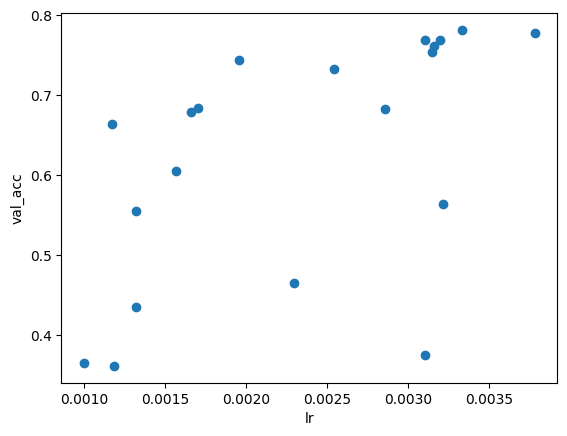

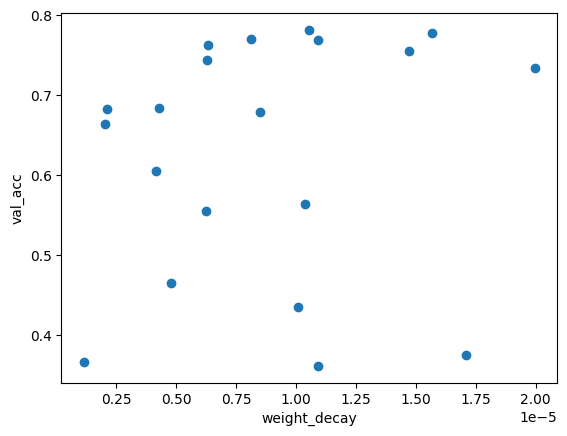

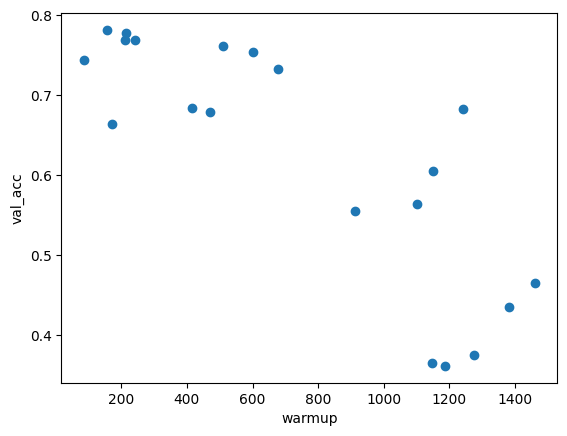

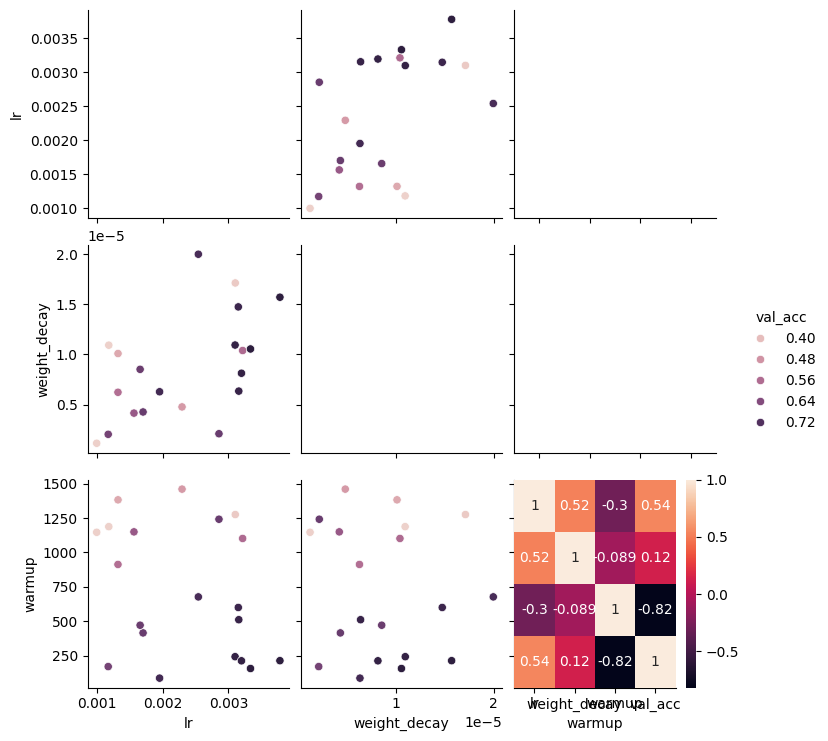

In [13]:
#random search hyperparameters
import pickle
import seaborn as sns
import pandas as pd

# hyperparameters space

search_rand  = { #first random hyperparam tune
    'lr': 10**np.random.uniform(-5, -1),
    'weight_decay': 10**np.random.uniform(-8, -4),
    'alpha':  np.random.uniform(0.4, 2),
}

search_rand2  = { #second random hyperparam tune
    'lr': np.random.uniform(0.0008,0.004),
    'weight_decay': np.random.uniform(1e-6, 2e-5),
    'warmup_period' : np.random.randint(0, 2000)

}
save_train_results = []
save_val_results = []

iterations = 20

for r in range(iterations): #this is the code for the 2nd random hyperparameter search
    l = np.random.uniform(0.0008,0.004)
    w = np.random.uniform(1e-6, 2e-5)
    #a = np.random.uniform(0.4, 2)
    a = 1 #alpha now set to 1 since I didnt see much correlation between alpha and validation accuracy/loss
    warm = np.random.randint(0, 1500)

    print("lr: {}, weight_decay: {}, warmup: {}".format(l, w, warm))
    model = MyResNet(alpha=a)
    optimizer = optim.Adamax(model.parameters(), lr=l, weight_decay=w)
    t_l, v_a, v_l = train_part(model, optimizer, epochs=15, print_every=30, warmup_period=warm)
    val_acc, val_loss = check_accuracy(loader_val, model, analysis=True, plot=False)

    save_train_results.append([l, w, warm, t_l, v_a, v_l])
    save_val_results.append([l, w, warm, val_acc, val_loss])

    print("lr:", l, " weight_decay:", w,  "warmup_period:", warm, " val_acc:", val_acc, " val_loss:", val_loss)
          
          
# Save the results
with open('random2_train_results.pkl', 'wb') as f:
    pickle.dump(save_train_results, f)

with open('random2_val_results.pkl', 'wb') as f:
    pickle.dump(save_val_results, f)

df = pd.DataFrame(save_val_results, columns=['lr', 'weight_decay', 'warmup', 'val_acc', 'val_loss'])

plt.figure()
plt.scatter(df['lr'], df['val_acc'])
plt.xlabel('lr')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(df['weight_decay'], df['val_acc'])
plt.xlabel('weight_decay')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(df['warmup'], df['val_acc'])
plt.xlabel('warmup')
plt.ylabel('val_acc')

sns.pairplot(df, vars=['lr', 'weight_decay', 'warmup'], hue='val_acc')

corr = df[['lr', 'weight_decay', 'warmup', 'val_acc']].corr()
sns.heatmap(corr, annot=True)


          lr  weight_decay  warmup   val_acc  val_loss
19  0.003334      0.000011     156  0.781576  0.858199
18  0.003781      0.000016     213  0.777407  0.838193
9   0.003197      0.000008     212  0.769487  0.873257
1   0.003100      0.000011     242  0.768654  0.909021
3   0.003156      0.000006     511  0.761984  0.873889
12  0.003149      0.000015     600  0.754481  0.956065
4   0.001953      0.000006      86  0.743643  0.984395
5   0.002542      0.000020     677  0.733222  1.035725
7   0.001702      0.000004     415  0.683618  1.272852
2   0.002855      0.000002    1242  0.682368  1.220971
17  0.001658      0.000009     471  0.678616  1.227106
13  0.001173      0.000002     170  0.664027  1.275817
6   0.001564      0.000004    1150  0.604835  1.721606
16  0.003215      0.000010    1102  0.563985  1.702628
11  0.001321      0.000006     913  0.554815  1.834516
15  0.002294      0.000005    1461  0.465194  1.993221
10  0.001322      0.000010    1383  0.435181  2.330308
0   0.0031

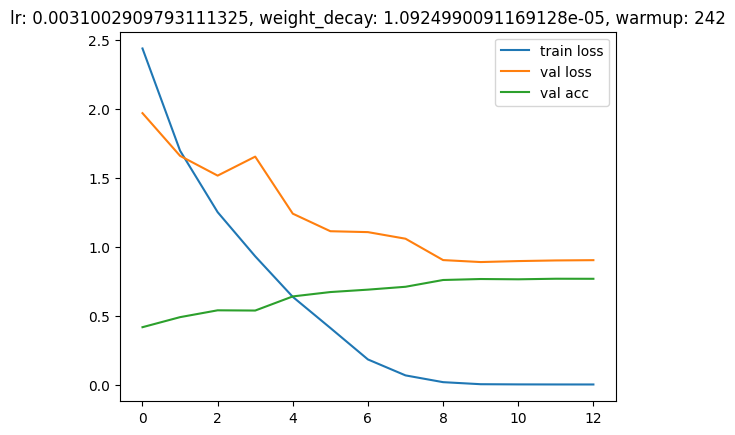

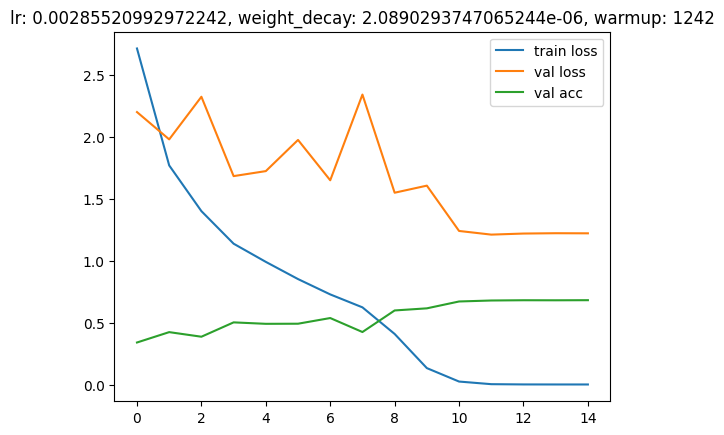

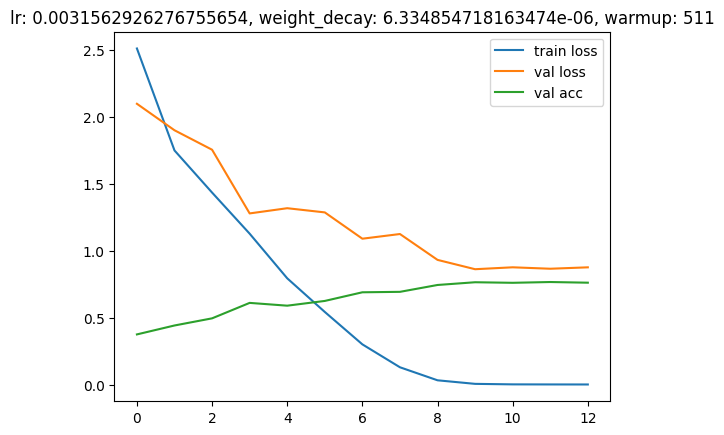

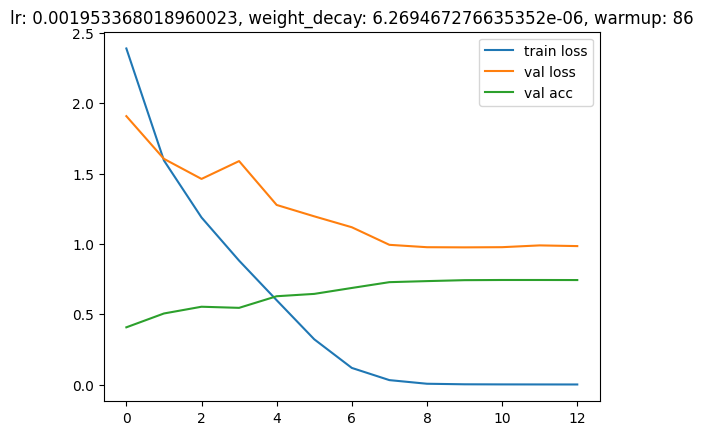

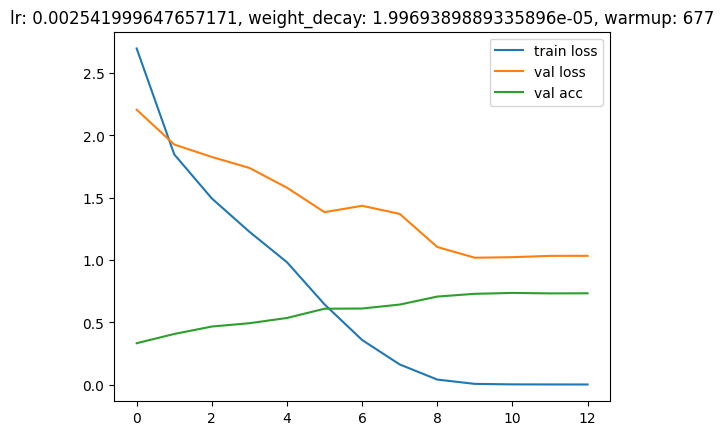

...

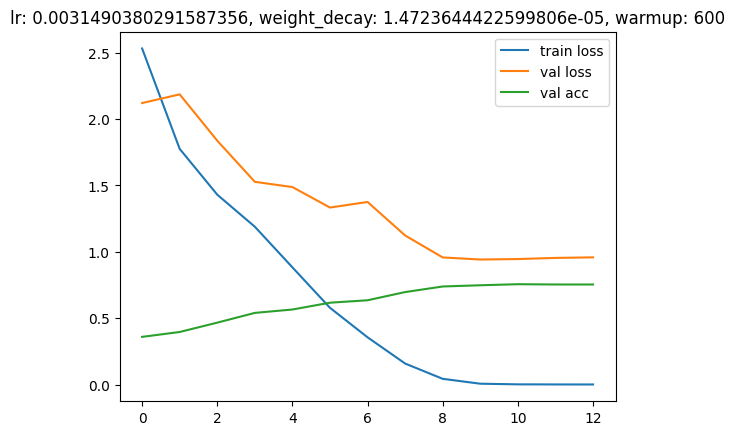

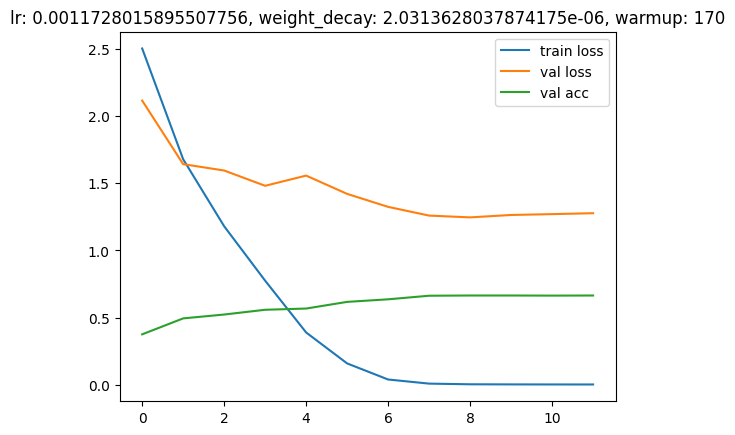

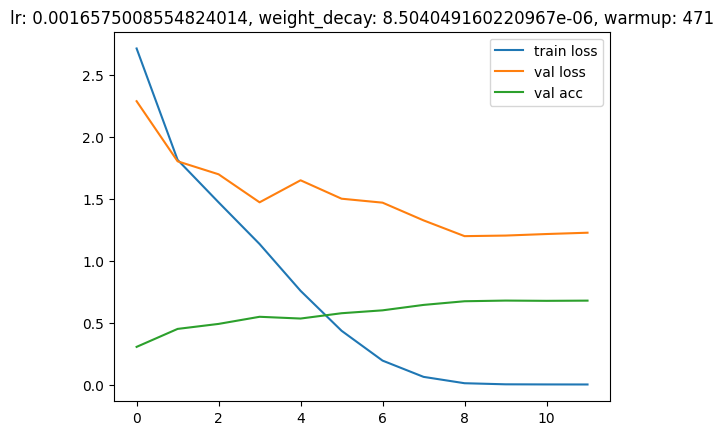

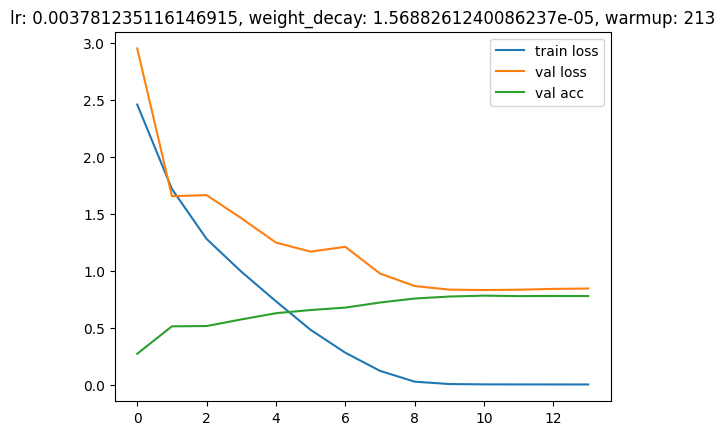

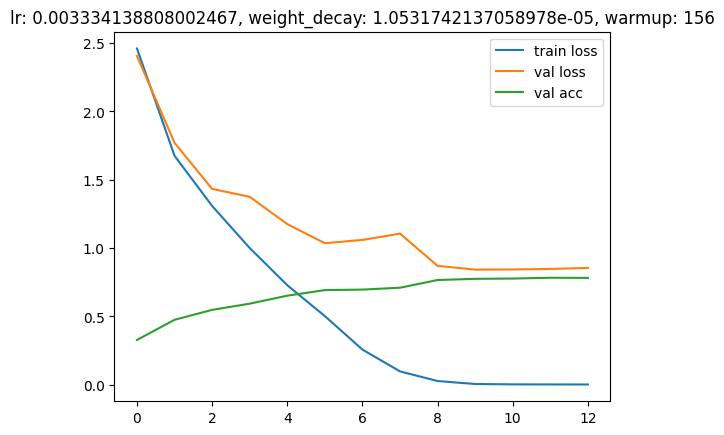

Text(0, 0.5, 'val_acc')

<Figure size 640x480 with 0 Axes>

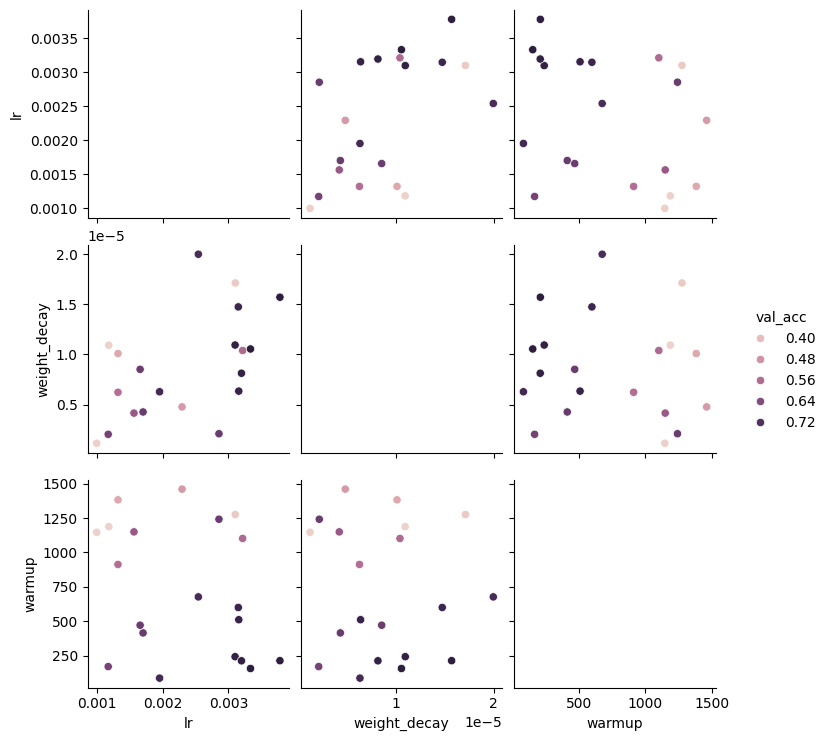

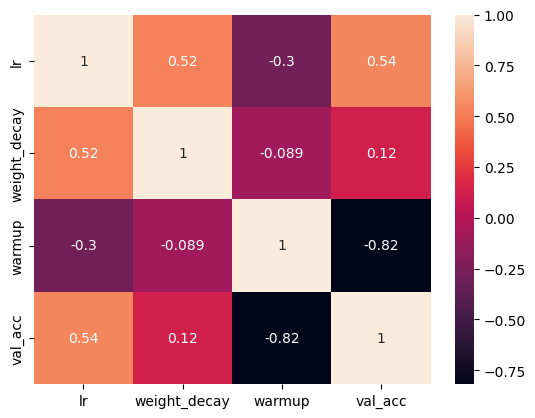

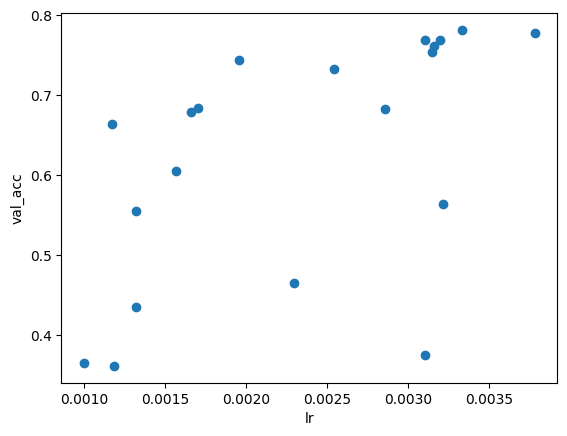

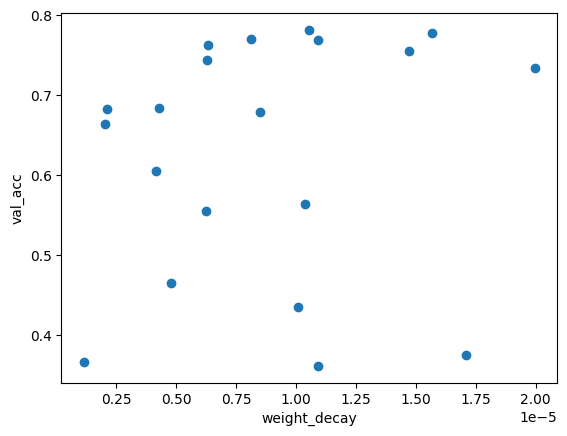

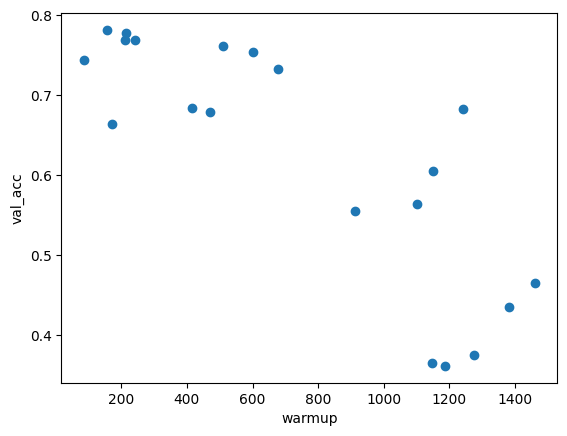

In [247]:
#2nd random hyperparam search results visualisation
hp_opt_res = df
rand_sorted = hp_opt_res.sort_values(by=['val_acc'], ascending=False)

#pickle save df
with open('random2_hyperparam_search_res.pkl', 'wb') as f:
    pickle.dump(hp_opt_res, f)

print(rand_sorted)

#plot all train vs val loss

for t in save_train_results:
    if t[4][-1] < 0.62: #only care about better values
        continue
    plt.figure()
    plt.title("lr: {}, weight_decay: {}, warmup: {}".format(t[0], t[1], t[2]))
    plt.plot(t[3], label='train loss')
    plt.plot(t[5], label='val loss')
    plt.plot(t[4], label='val acc')
    plt.legend()
    plt.show()

plt.figure()
sns.pairplot(df, vars=['lr', 'weight_decay', 'warmup'], hue='val_acc')

plt.figure()
corr = df[['lr', 'weight_decay', 'warmup', 'val_acc']].corr()
sns.heatmap(corr, annot=True)

plt.figure()
plt.scatter(df['lr'], df['val_acc'])
plt.xlabel('lr')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(df['weight_decay'], df['val_acc'])
plt.xlabel('weight_decay')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(df['warmup'], df['val_acc'])
plt.xlabel('warmup')
plt.ylabel('val_acc')



          lr  weight_decay     alpha   val_acc  val_loss
6   0.002756  1.044579e-05  1.987539  0.631632  1.308289
18  0.003775  1.917671e-06  0.707623  0.611612  1.331293
1   0.011214  4.502173e-07  1.065852  0.574074  1.423183
19  0.000417  8.438650e-05  1.409093  0.570070  1.735265
5   0.008298  1.654398e-06  1.498203  0.556557  1.473245
2   0.000479  2.780814e-08  0.433669  0.551552  1.892712
4   0.014586  8.219257e-08  0.468237  0.550551  1.499227
0   0.000519  2.756885e-07  0.542484  0.544044  1.916223
7   0.000277  1.315927e-05  1.973173  0.506507  1.879428
15  0.000291  2.219113e-08  0.782806  0.503504  1.964254


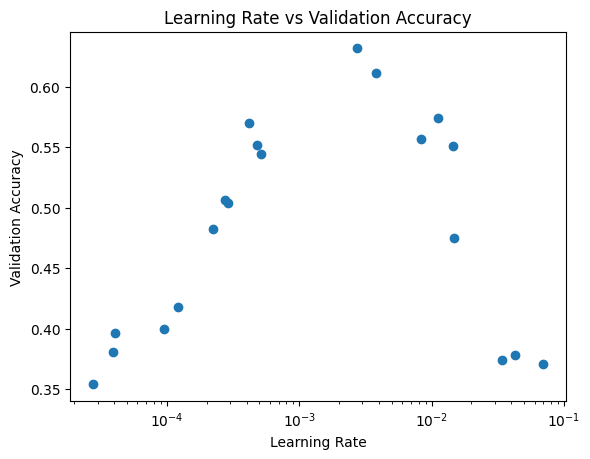

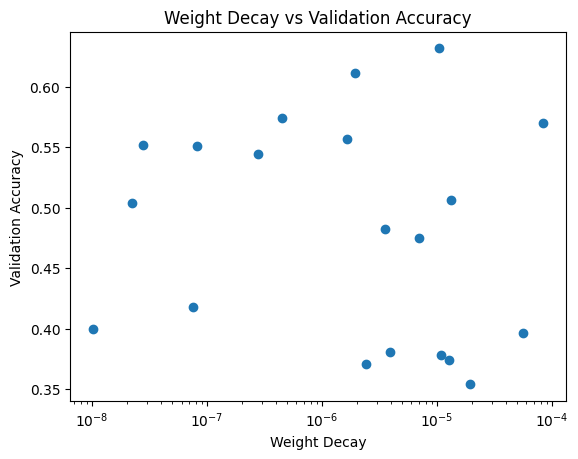

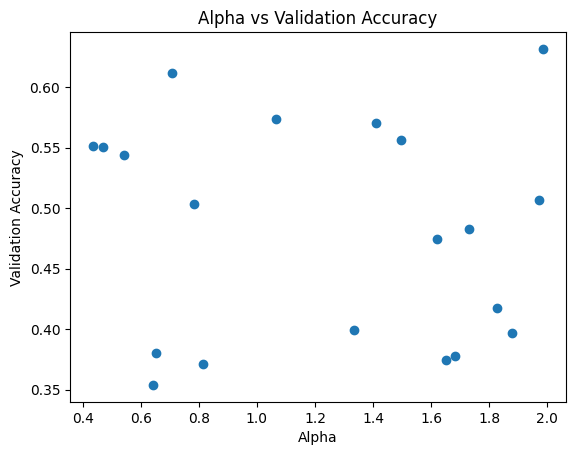

In [165]:
#first random hyperparam search results
sorted = hp_opt_res.sort_values(by=['val_acc'], ascending=False)
print(sorted.head(10))

pivot_table = df.pivot(index='lr', columns='weight_decay', values='val_acc') # replace 'val_acc' with 'val_loss' to plot loss

#plot lr vs val_acc
plt.figure()
plt.scatter(hp_opt_res['lr'], hp_opt_res['val_acc'])
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs Validation Accuracy')
plt.xscale('log')
plt.show()

#plot weight_decay vs val_acc
plt.figure()
plt.scatter(hp_opt_res['weight_decay'], hp_opt_res['val_acc'])
plt.xlabel('Weight Decay')
plt.ylabel('Validation Accuracy')
plt.title('Weight Decay vs Validation Accuracy')
plt.xscale('log')
plt.show()

#plot alpha vs val_acc
plt.figure()
plt.scatter(hp_opt_res['alpha'], hp_opt_res['val_acc'])
plt.xlabel('Alpha')
plt.ylabel('Validation Accuracy')
plt.title('Alpha vs Validation Accuracy')
plt.show()

In [271]:
#grid hyperparam search

search  = {
    'lr': np.linspace(1e-3, 4e-3, num=4),
    'weight_decay': np.logspace(-6, -4, num=4),
    'alpha': [0.6, 1, 1.4] #0.2
}

print(search)

save_train_results = []
save_val_results = []

#grid search

for l in search['lr']:
    for w in search['weight_decay']:
        for a in search['alpha']:
            print("lr: {}, weight_decay: {}, alpha: {}".format(l, w, a))
            model = MyResNet(alpha=a)
            optimizer = optim.Adamax(model.parameters(), lr=l, weight_decay=w)
            t_l, v_a, v_l = train_part(model, optimizer, epochs=8, print_every=30)
            val_acc, val_loss = check_accuracy(loader_val, model, analysis=True, plot=False)

            save_train_results.append([l, w, a, t_l, v_a, v_l])
            save_val_results.append([l, w, a, val_acc, val_loss])

            print("lr:", l, " weight_decay:", w, " alpha:", a, " val_acc:", val_acc, " val_loss:", val_loss)




# Save the results
with open('grid_train_results.pkl', 'wb') as f:
    pickle.dump(save_train_results, f)

with open('grid_val_results.pkl', 'wb') as f:
    pickle.dump(save_val_results, f)

df = pd.DataFrame(save_val_results, columns=['lr', 'weight_decay', 'alpha', 'val_acc', 'val_loss'])
pivot_table = df.pivot(index='lr', columns='weight_decay', values='val_acc') # replace 'val_acc' with 'val_loss' to plot loss


{'lr': array([0.001, 0.002, 0.003, 0.004]), 'weight_decay': array([1.00000000e-06, 4.64158883e-06, 2.15443469e-05, 1.00000000e-04]), 'alpha': [0.6, 1, 1.4]}
lr: 0.001, weight_decay: 1e-06, alpha: 0.6
Epoch: 0, Iteration 0, loss = 5.2338
Epoch: 0, Iteration 30, loss = 2.6980
Epoch: 0, Iteration 60, loss = 2.1773
Epoch: 0, Iteration 90, loss = 2.1052
Epoch: 0, Iteration 120, loss = 1.9680
Epoch: 0, Iteration 150, loss = 1.7869
Got 855 / 2274 correct of val set (37.60)
Epoch: 1, Iteration 0, loss = 2.0257
Epoch: 1, Iteration 30, loss = 1.9802
Epoch: 1, Iteration 60, loss = 1.6969
Epoch: 1, Iteration 90, loss = 1.6618
Epoch: 1, Iteration 120, loss = 1.5603
Epoch: 1, Iteration 150, loss = 1.4751
Got 1125 / 2274 correct of val set (49.47)
Epoch: 2, Iteration 0, loss = 1.2408
Epoch: 2, Iteration 30, loss = 1.2793
Epoch: 2, Iteration 60, loss = 1.4134
Epoch: 2, Iteration 90, loss = 1.0860
Epoch: 2, Iteration 120, loss = 1.2878
Epoch: 2, Iteration 150, loss = 1.2252
Got 1235 / 2274 correct of v

ValueError: Index contains duplicate entries, cannot reshape

In [248]:
#2nd grid hyperparam search 

search_grid  = { #first random hyperparam tune
    'lr': [0.002,0.0025,0.003,0.0035,0.004],
    'warmup': [200,350,500,650]
}


save_train_results = []
save_val_results = []

lr_range = search_grid['lr']
warmup_range = search_grid['warmup']

for l in lr_range:
    for w in warmup_range:
        a = 1 #alpha now set to 1 since I didnt see much correlation between alpha and validation accuracy/loss

        print("lr: {}, warmup: {}".format(l, w))
        model = MyResNet(alpha=a)
        optimizer = optim.Adamax(model.parameters(), lr=l, weight_decay=6e-5) #fix weight decay as no obvious winner again
        t_l, v_a, v_l = train_part(model, optimizer, epochs=20, print_every=30, warmup_period=w)
        val_acc, val_loss = check_accuracy(loader_val, model, analysis=True, plot=False)

        save_train_results.append([l, w, t_l, v_a, v_l])
        save_val_results.append([l, w, val_acc, val_loss])

        print("lr:", l, "warmup_period:", w, " val_acc:", val_acc, " val_loss:", val_loss)
          
          
# Save the results
with open('grid2_train_results.pkl', 'wb') as f:
    pickle.dump(save_train_results, f)

with open('grid2_val_results.pkl', 'wb') as f:
    pickle.dump(save_val_results, f)

df = pd.DataFrame(save_val_results, columns=['lr', 'warmup', 'val_acc', 'val_loss'])

lr: 0.002, warmup: 200
lr:  1e-05
Epoch: 0, Iteration 0, loss = 3.9924
lr:  0.00011
lr:  0.00021
lr:  0.00031
Epoch: 0, Iteration 30, loss = 2.7437
lr:  0.00041
lr:  0.00051
lr:  0.00061
Epoch: 0, Iteration 60, loss = 2.4220
lr:  0.00071
lr:  0.0008100000000000001
lr:  0.00091
Epoch: 0, Iteration 90, loss = 2.3384
lr:  0.00101
lr:  0.00111
lr:  0.00121
Epoch: 0, Iteration 120, loss = 2.3430
lr:  0.0013100000000000002
lr:  0.00141
lr:  0.00151
Epoch: 0, Iteration 150, loss = 1.8511
lr:  0.00161
Got 910 / 2399 correct of val set (37.93)
Avg val loss:  1.9985930794163753
lr:  0.0017
Epoch: 1, Iteration 0, loss = 1.7972
lr:  0.0018000000000000002
lr:  0.0019
lr:  0.002
Epoch: 1, Iteration 30, loss = 1.7218
lr:  0.0019999512008814463
lr:  0.0019998048082884917
lr:  0.0019995608365087946
Epoch: 1, Iteration 60, loss = 2.0925
lr:  0.001999219309353571
lr:  0.0019987802601552714
lr:  0.001998243731764321
Epoch: 1, Iteration 90, loss = 1.6553
lr:  0.0019976097765449456
lr:  0.001996878456370057

        lr  warmup   val_acc  val_loss
16  0.0040     200  0.792414  0.861983
12  0.0035     200  0.786578  0.881655
19  0.0040     650  0.783660  0.904312
9   0.0030     350  0.780742  0.900210
14  0.0035     500  0.778241  0.954540
18  0.0040     500  0.777824  0.934771
13  0.0035     350  0.776574  0.915785
8   0.0030     200  0.775740  0.910828
15  0.0035     650  0.775323  0.878974
10  0.0030     500  0.774489  0.950498
6   0.0025     500  0.766153  0.987290
11  0.0030     650  0.760734  0.969782
4   0.0025     200  0.754481  1.014865
5   0.0025     350  0.753231  0.998149
0   0.0020     200  0.745727  1.053660
7   0.0025     650  0.743643  1.083755
1   0.0020     350  0.739058  1.102197
17  0.0040     350  0.726136  1.097664
2   0.0020     500  0.716965  1.205352
3   0.0020     650  0.697791  1.294096


Text(0, 0.5, 'val_acc')

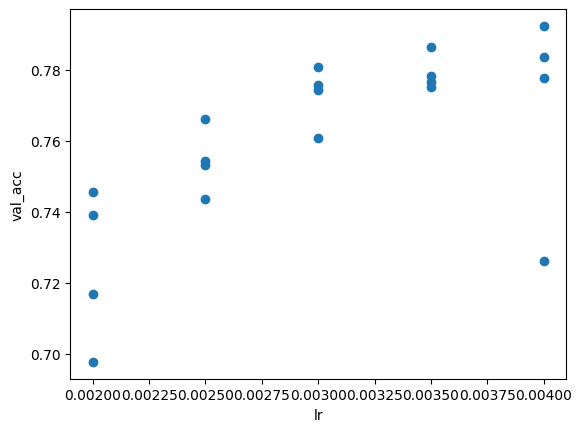

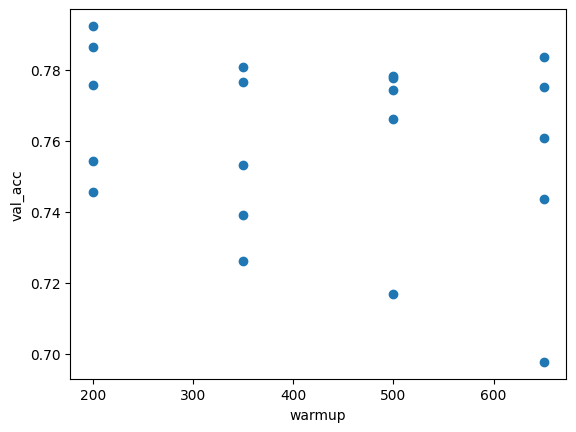

In [254]:
grid_2_res = df.sort_values(by=['val_acc'], ascending=False)
print(grid_2_res)

plt.figure()
plt.scatter(grid_2_res['lr'], grid_2_res['val_acc'])
plt.xlabel('lr')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(grid_2_res['warmup'], grid_2_res['val_acc'])
plt.xlabel('warmup')
plt.ylabel('val_acc')



In [8]:
#3rd grid hyperparam search


search_grid  = { 
    'lr': [0.003, 0.004, 0.005, 0.006, 0.007],
    'warmup': [200,400,600,800]
}


save_train_results = []
save_val_results = []

lr_range = search_grid['lr']
warmup_range = search_grid['warmup']

for l in lr_range:
    for w in warmup_range:
        a = 1 #alpha now set to 1 since I didnt see much correlation between alpha and validation accuracy/loss

        print("lr: {}, warmup: {}".format(l, w))
        model = MyResNet(alpha=a)
        optimizer = optim.Adamax(model.parameters(), lr=l, weight_decay=6e-5) #fix weight decay as no obvious winner again
        t_l, v_a, v_l = train_part(model, optimizer, epochs=20, print_every=30, warmup_period=w)
        val_acc, val_loss = check_accuracy(loader_val, model, analysis=True, plot=False)

        save_train_results.append([l, w, t_l, v_a, v_l])
        save_val_results.append([l, w, val_acc, val_loss])

        print("lr:", l, "warmup_period:", w, " val_acc:", val_acc, " val_loss:", val_loss)
          
          
# Save the results
with open('grid3_train_results.pkl', 'wb') as f:
    pickle.dump(save_train_results, f)

with open('grid3_val_results.pkl', 'wb') as f:
    pickle.dump(save_val_results, f)

df = pd.DataFrame(save_val_results, columns=['lr', 'warmup', 'val_acc', 'val_loss'])

lr: 0.003, warmup: 200
lr:  1.5e-05
Epoch: 0, Iteration 0, loss = 4.5988
lr:  0.000165
lr:  0.000315
lr:  0.000465
Epoch: 0, Iteration 30, loss = 2.8337
lr:  0.000615
lr:  0.0007650000000000001
lr:  0.000915
Epoch: 0, Iteration 60, loss = 2.5431
lr:  0.001065
lr:  0.0012150000000000002
lr:  0.0013650000000000001
Epoch: 0, Iteration 90, loss = 2.2192
lr:  0.001515
lr:  0.0016650000000000002
lr:  0.001815
Epoch: 0, Iteration 120, loss = 2.0761
lr:  0.001965
lr:  0.002115
lr:  0.002265
Epoch: 0, Iteration 150, loss = 1.9758
lr:  0.002415
Got 914 / 2399 correct of val set (38.10)
Avg val loss:  2.0569762869885095
lr:  0.00255
Epoch: 1, Iteration 0, loss = 1.8465
lr:  0.0027
lr:  0.00285
lr:  0.003
Epoch: 1, Iteration 30, loss = 1.7530
lr:  0.0029999268013221688
lr:  0.0029997072124327367
lr:  0.002999341254763192
Epoch: 1, Iteration 60, loss = 1.8665
lr:  0.0029988289640303575
lr:  0.002998170390232908
lr:  0.0029973655976464827
Epoch: 1, Iteration 90, loss = 1.7303
lr:  0.0029964146648174

       lr  warmup   val_acc  val_loss
19  0.007     800  0.799083  0.852885
16  0.007     200  0.796582  0.834289
13  0.006     400  0.795331  0.869417
12  0.006     200  0.794915  0.860915
9   0.005     400  0.792830  0.889516
18  0.007     600  0.784910  0.920084
15  0.006     800  0.783243  0.881702
14  0.006     600  0.783243  0.906713
8   0.005     200  0.781992  0.948456
10  0.005     600  0.780742  0.878879
7   0.004     800  0.780325  0.912884
11  0.005     800  0.778658  0.888409
5   0.004     400  0.776990  0.927011
6   0.004     600  0.773656  0.924415
4   0.004     200  0.773239  0.940637
0   0.003     200  0.764485  0.974471
2   0.003     600  0.762818  0.956718
17  0.007     400  0.749896  1.070523
3   0.003     800  0.701959  1.226777
1   0.003     400  0.671947  1.262683


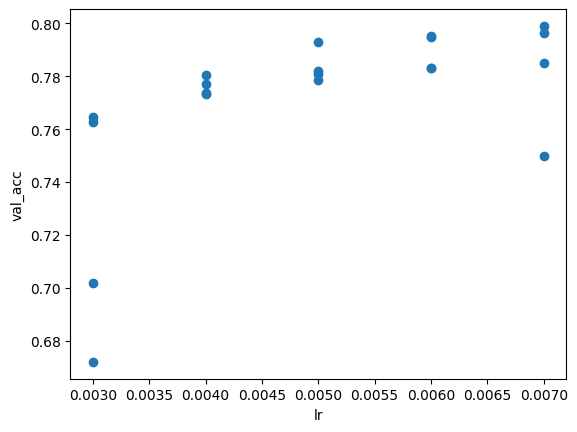

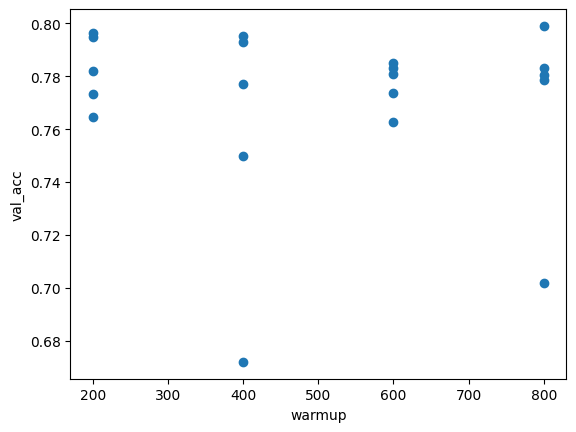

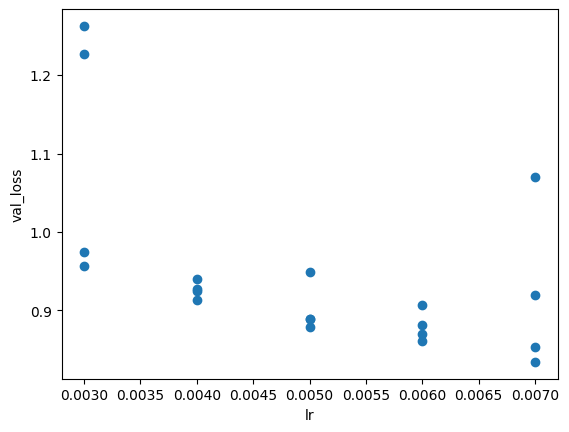

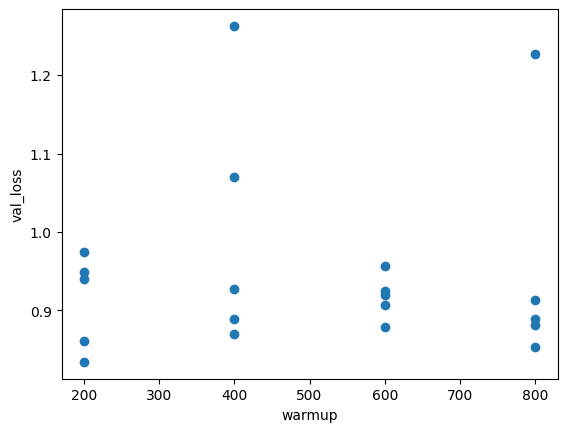

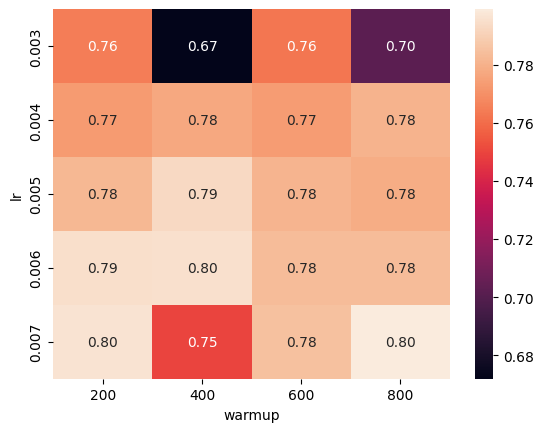

...

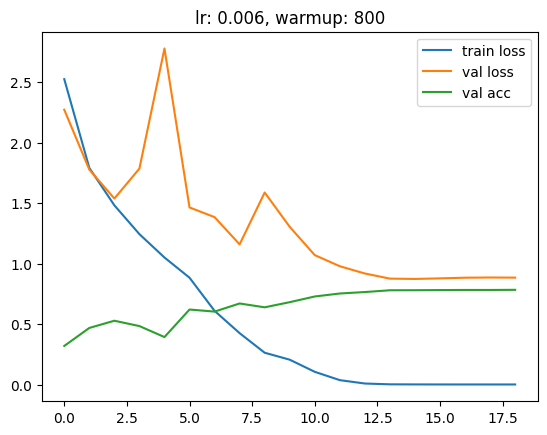

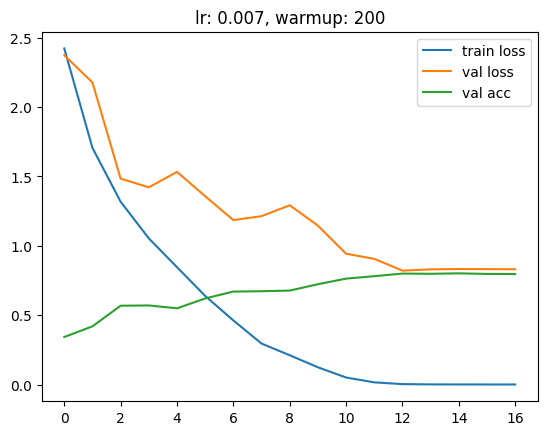

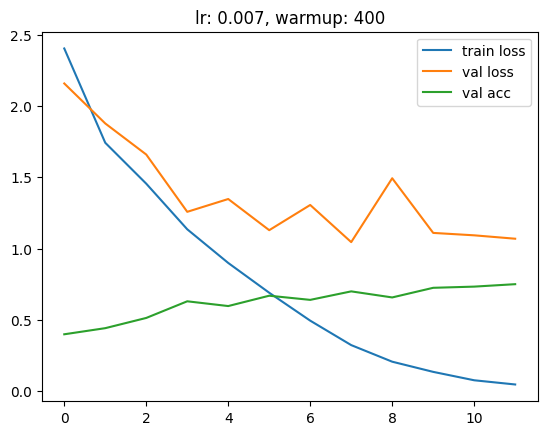

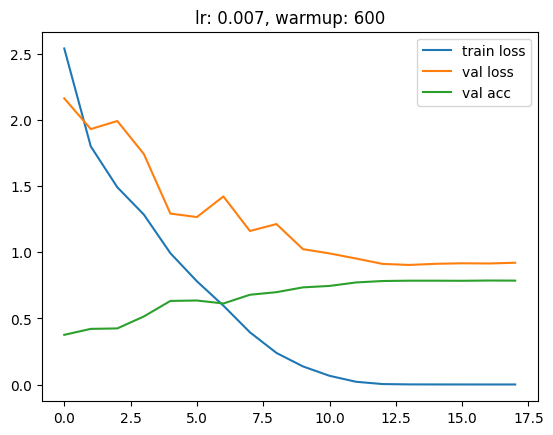

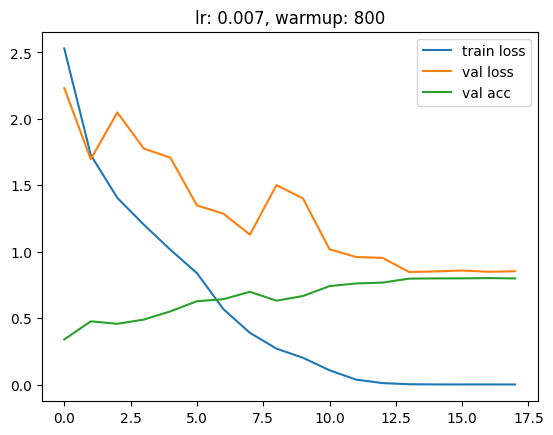

In [25]:
grid3_res = df.sort_values(by=['val_acc'], ascending=False)
print(grid3_res)

#plot
plt.figure()
plt.scatter(grid3_res['lr'], grid3_res['val_acc'])
plt.xlabel('lr')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(grid3_res['warmup'], grid3_res['val_acc'])
plt.xlabel('warmup')
plt.ylabel('val_acc')

plt.figure()
plt.scatter(grid3_res['lr'], grid3_res['val_loss'])
plt.xlabel('lr')
plt.ylabel('val_loss')

plt.figure()
plt.scatter(grid3_res['warmup'], grid3_res['val_loss'])
plt.xlabel('warmup')
plt.ylabel('val_loss')

plt.figure()
#heatmap
pivot_table = df.pivot(index='lr', columns='warmup', values='val_acc')
sns.heatmap(pivot_table, annot=True, fmt=".2f")

for t in save_train_results:
    if t[4][-1] < 0.77: #only care about better values
        continue
    plt.figure()
    plt.title("lr: {}, warmup: {}".format(t[0], t[1]))
    plt.plot(t[2], label='train loss')
    plt.plot(t[4], label='val loss')
    plt.plot(t[3], label='val acc')
    plt.legend()
    plt.show()

,lr,weight_decay,alpha,val_acc,val_loss
22,0.002,0.000100,1.0,0.697889,1.095668
18,0.002,0.000022,0.6,0.685576,1.124436
19,0.002,0.000022,1.0,0.680739,1.167885
15,0.002,0.000005,0.6,0.678980,1.164805
14,0.002,0.000001,1.4,0.677221,1.109518
33,0.003,0.000100,0.6,0.676341,1.144920
17,0.002,0.000005,1.4,0.668865,1.250591
28,0.003,0.000005,1.0,0.667986,1.147835
31,0.003,0.000022,1.0,0.667546,1.163359
12,0.002,0.000001,0.6,0.666227,1.209028


Top 50% Validation Accuracy for alpha = 0.6: 0.665127528583993


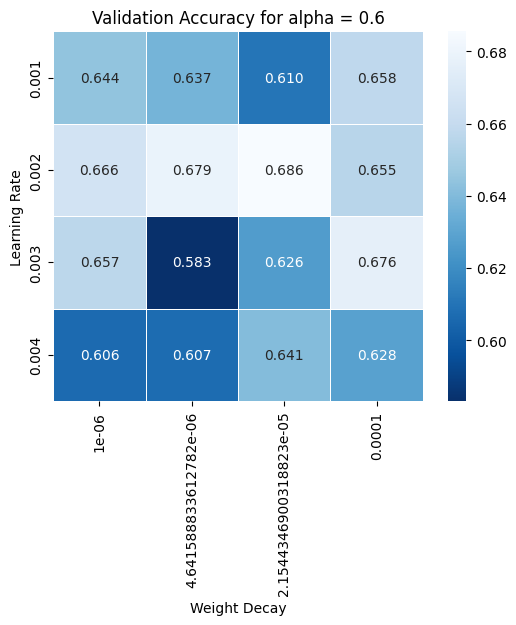

Top 50% Validation Accuracy for alpha = 1.0: 0.6697999120492524


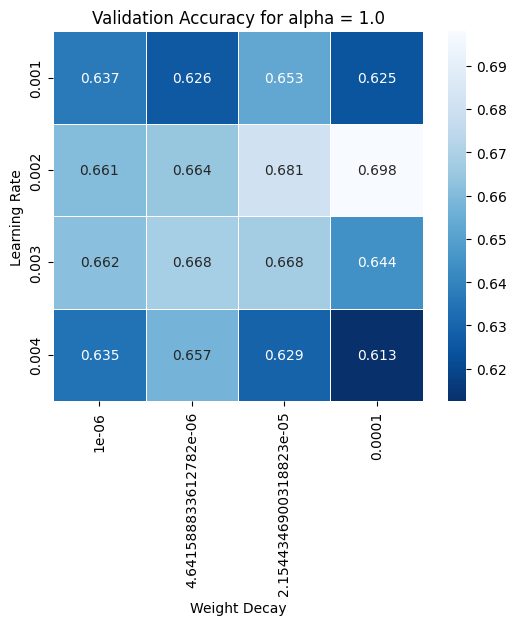

Top 50% Validation Accuracy for alpha = 1.4: 0.6518799472295516


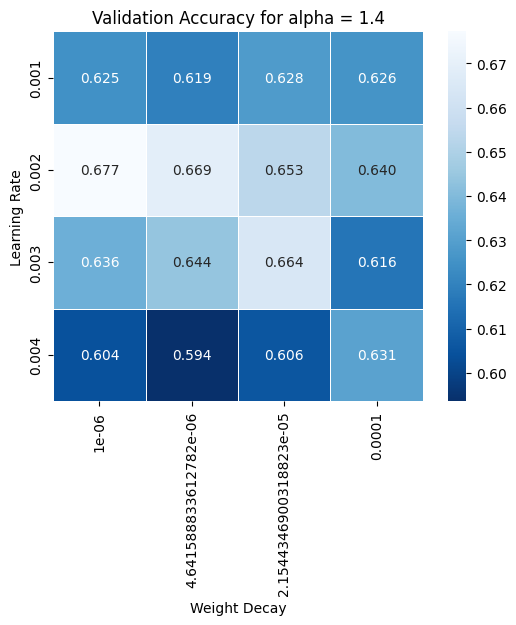

In [286]:
#1st grid hyperparam results visualisation
grid_hp_opt_res = df
sorted_grid = grid_hp_opt_res.sort_values(by=['val_acc'], ascending=False)

#pickle save df
with open('grid_hyperparam_search_res.pkl', 'wb') as f:
    pickle.dump(grid_hp_opt_res, f)

display(sorted_grid.head(10))

# Pivot the DataFrame to create a [lr, weight_decay] matrix for each alpha
for alpha in grid_hp_opt_res['alpha'].unique():
    df_alpha = grid_hp_opt_res[grid_hp_opt_res['alpha'] == alpha]
    pivot_table = df_alpha.pivot(index='lr', columns='weight_decay', values='val_acc')
    df_alpha_tophalf = df_alpha.sort_values(by=['val_acc'], ascending=False).head(8)
    avg_val_acc = df_alpha_tophalf['val_acc'].mean()
    print(f'Top 50% Validation Accuracy for alpha = {alpha}: {avg_val_acc}')
    plt.figure()
    sns.heatmap(pivot_table, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
    plt.ylabel('Learning Rate')
    plt.xlabel('Weight Decay')
    plt.title(f'Validation Accuracy for alpha = {alpha}');
    plt.show()

#best lr is definitely 0.002
#take alpha = 1, no clear winner here, but avg validation accuracy is slightly better
#take weight_decay = 6.1e-5, took avg of top 2 weight decays for alpha = 1

Total number of parameters is: 11204164
lr:  3.5000000000000004e-05
Epoch: 0, Iteration 0, loss = 4.2336
lr:  0.00038500000000000003
lr:  0.000735
Epoch: 0, Iteration 20, loss = 2.8567
lr:  0.001085
lr:  0.0014349999999999999
Epoch: 0, Iteration 40, loss = 2.8157
lr:  0.0017850000000000001
lr:  0.002135
Epoch: 0, Iteration 60, loss = 2.5870
lr:  0.002485
lr:  0.0028350000000000003
Epoch: 0, Iteration 80, loss = 2.3507
lr:  0.0031850000000000003
lr:  0.003535
Epoch: 0, Iteration 100, loss = 2.2689
lr:  0.0038850000000000004
lr:  0.004235
Epoch: 0, Iteration 120, loss = 2.0210
lr:  0.0045850000000000005
lr:  0.004935
Epoch: 0, Iteration 140, loss = 2.2646
lr:  0.005285
lr:  0.005635
Epoch: 0, Iteration 160, loss = 2.1210
Got 718 / 2399 correct of val set (29.93)
Avg val loss:  2.49141095813952
lr:  0.0059499999999999996
Epoch: 1, Iteration 0, loss = 1.9257
lr:  0.0063
lr:  0.00665
Epoch: 1, Iteration 20, loss = 1.9744
lr:  0.007
lr:  0.006999758267592531
Epoch: 1, Iteration 40, loss = 1.

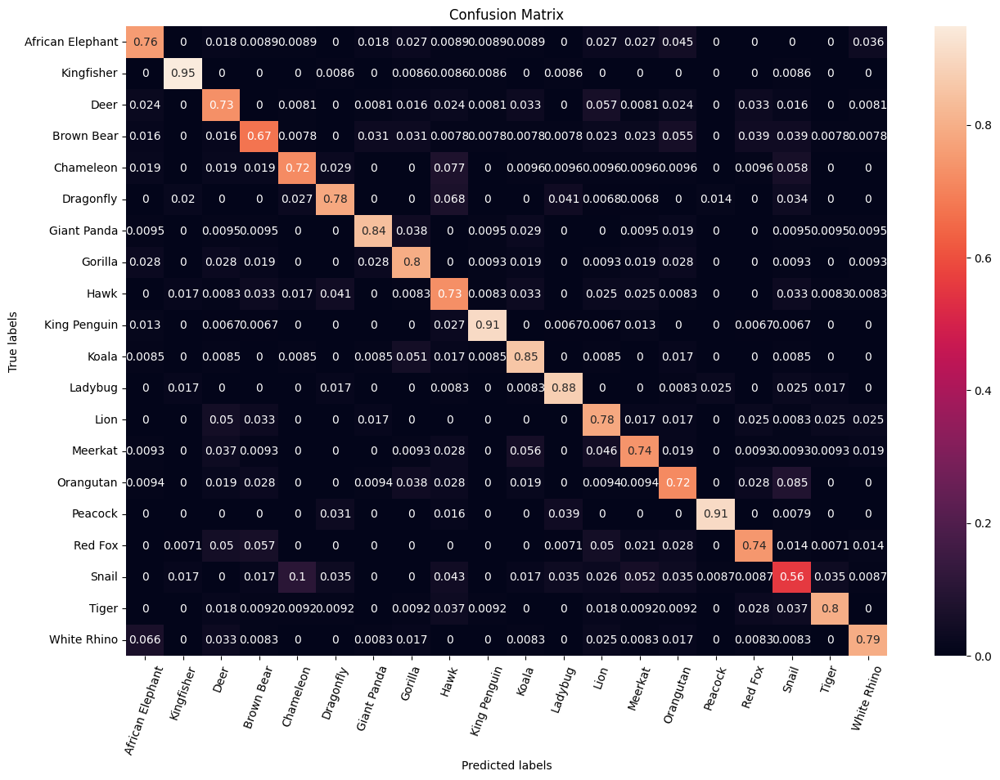

              labels  precision    recall        f1
0   African Elephant   0.788771  0.758929  0.773562
1         Kingfisher   0.924043  0.948276  0.936002
2               Deer   0.695436  0.731707  0.713111
3         Brown Bear   0.722242  0.671875  0.696149
4          Chameleon   0.791042  0.721154  0.754483
5          Dragonfly   0.820980  0.783784  0.801951
6        Giant Panda   0.867573  0.838095  0.852580
7            Gorilla   0.758700  0.796296  0.777044
8               Hawk   0.646113  0.727273  0.684295
9       King Penguin   0.920542  0.906667  0.913551
10             Koala   0.775493  0.854701  0.813173
11           Ladybug   0.849927  0.875000  0.862281
12              Lion   0.692780  0.783333  0.735279
13           Meerkat   0.741761  0.740741  0.741250
14         Orangutan   0.679684  0.716981  0.697835
15           Peacock   0.950448  0.905512  0.927436
16           Red Fox   0.792559  0.744681  0.767875
17             Snail   0.571663  0.556522  0.563991
18          

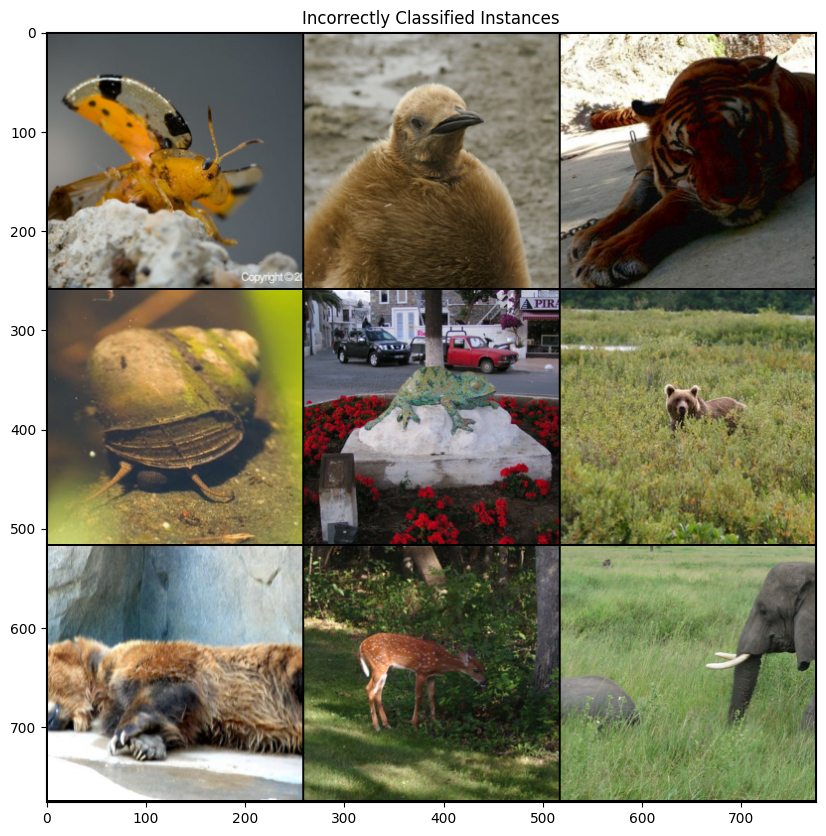

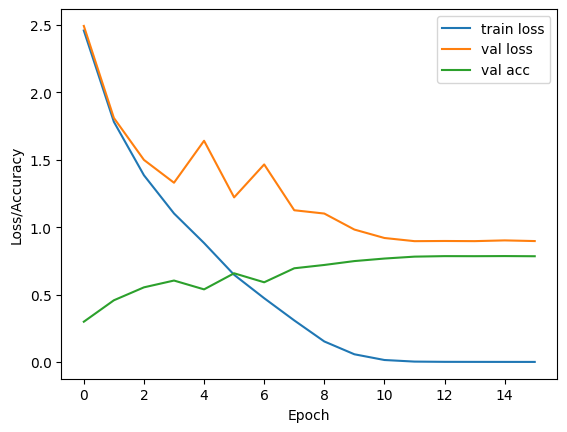

In [26]:
# define and train the network
model = MyResNet(alpha = 1)
optimizer = optim.Adamax(model.parameters(), lr=0.007, weight_decay=6e-5)

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

epochs = 17

train_losses, val_acc, val_loss = train_part(model, optimizer, epochs=epochs, print_every=20, warmup_period=200)


# report test set accuracy
check_accuracy(loader_val, model, analysis=True)

# plot the training vs validation loss
plt.figure()
plt.plot(train_losses, label="train loss")
plt.plot(val_loss, label="val loss")
plt.plot(val_acc, label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()


# save the model
torch.save(model.state_dict(), "model.pt")


#score of 65.92 with hyperparams lr=0.003, weight_decay=7e-6, alpha=1
#68.65 with augmentation and class weights
#dropout worsened performance - 61.48
#score of 67.99 with hyperparams lr=0.002, weight_decay=6.1e-5, alpha=1
#radam default = 59.76
#radam with weight decay = 6.1e-5 = 63.88


#warmup to 0.002 (100 iterations), then cosineannealing gave 71.28. early stopped at epoch 9
#untuned linear warmup wasnt as good - stopped it early
#warmup to 0.002 (600 iterations), then cosineannealing gave 69.36 but could go better with more epochs
#cosineannealingwarmrestarts worse
#warmup over 840 iterations, then reduceonplateau (patience 2) - worse

## First run

Total number of parameters is: 11204164
Epoch: 0, Iteration 140, loss = 2.6327
Got 553 / 1998 correct of val set (27.68)
Epoch: 1, Iteration 140, loss = 2.0106
Got 630 / 1998 correct of val set (31.53)
Epoch: 2, Iteration 140, loss = 1.5995
Got 682 / 1998 correct of val set (34.13)
Epoch: 3, Iteration 140, loss = 1.5051
Got 703 / 1998 correct of val set (35.19)
Epoch: 4, Iteration 140, loss = 1.3414
Got 738 / 1998 correct of val set (36.94)
Epoch: 5, Iteration 140, loss = 0.6461
Got 723 / 1998 correct of val set (36.19)
Epoch: 6, Iteration 140, loss = 0.5828
Got 715 / 1998 correct of val set (35.79)
Epoch: 7, Iteration 140, loss = 0.9416
Got 723 / 1998 correct of val set (36.19)
Epoch: 8, Iteration 140, loss = 0.2311
Got 722 / 1998 correct of val set (36.14)
Epoch: 9, Iteration 140, loss = 0.1717
Got 748 / 1998 correct of val set (37.44)

---

<!-- BEGIN QUESTION -->

### Network Performance

Run the code below when all engineering decisions have been made, do not overfit to the test set!

**Note that** this will appear in the output, and be checked by markers (so ensure it is present in the auto-export)

Got 1511 / 2000 correct of val set (75.55)
Avg val loss:  1.0940472707152367
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


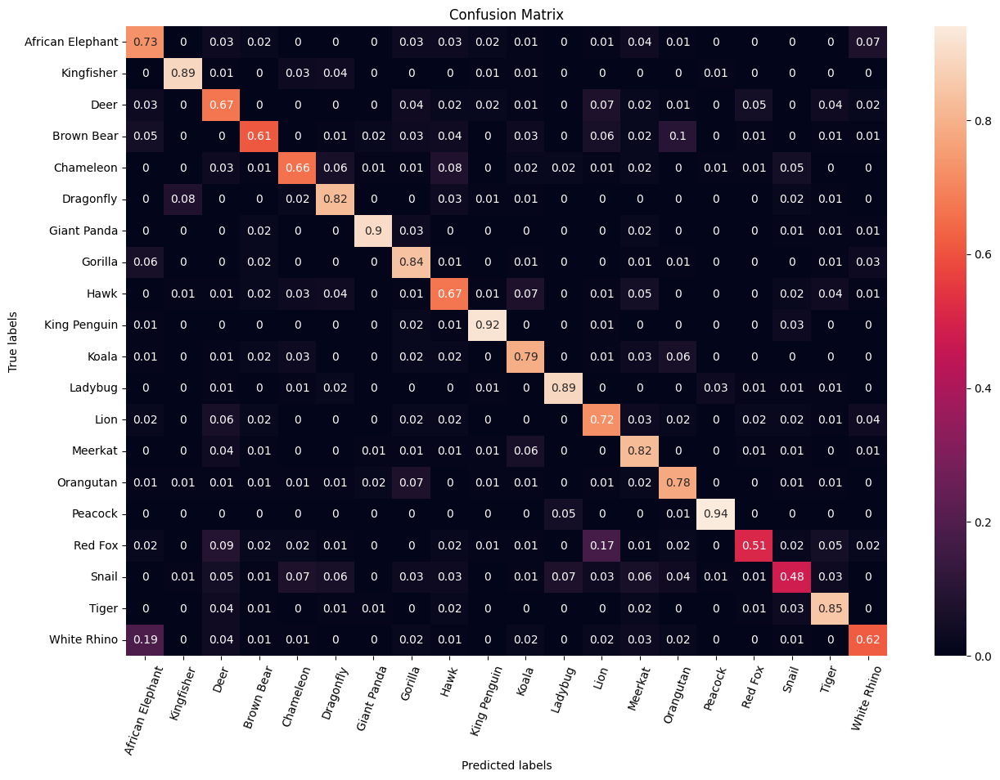

              labels  precision  recall        f1
0   African Elephant   0.646018    0.73  0.685446
1         Kingfisher   0.890000    0.89  0.890000
2               Deer   0.609091    0.67  0.638095
3         Brown Bear   0.753086    0.61  0.674033
4          Chameleon   0.741573    0.66  0.698413
5          Dragonfly   0.759259    0.82  0.788462
6        Giant Panda   0.927835    0.90  0.913706
7            Gorilla   0.711864    0.84  0.770642
8               Hawk   0.656863    0.67  0.663366
9       King Penguin   0.893204    0.92  0.906404
10             Koala   0.738318    0.79  0.763285
11           Ladybug   0.864078    0.89  0.876847
12              Lion   0.637168    0.72  0.676056
13           Meerkat   0.683333    0.82  0.745455
14         Orangutan   0.722222    0.78  0.750000
15           Peacock   0.940000    0.94  0.940000
16           Red Fox   0.796875    0.51  0.621951
17             Snail   0.666667    0.48  0.558140
18             Tiger   0.787037    0.85  0.817308


(0.7555, 1.0940472707152367)

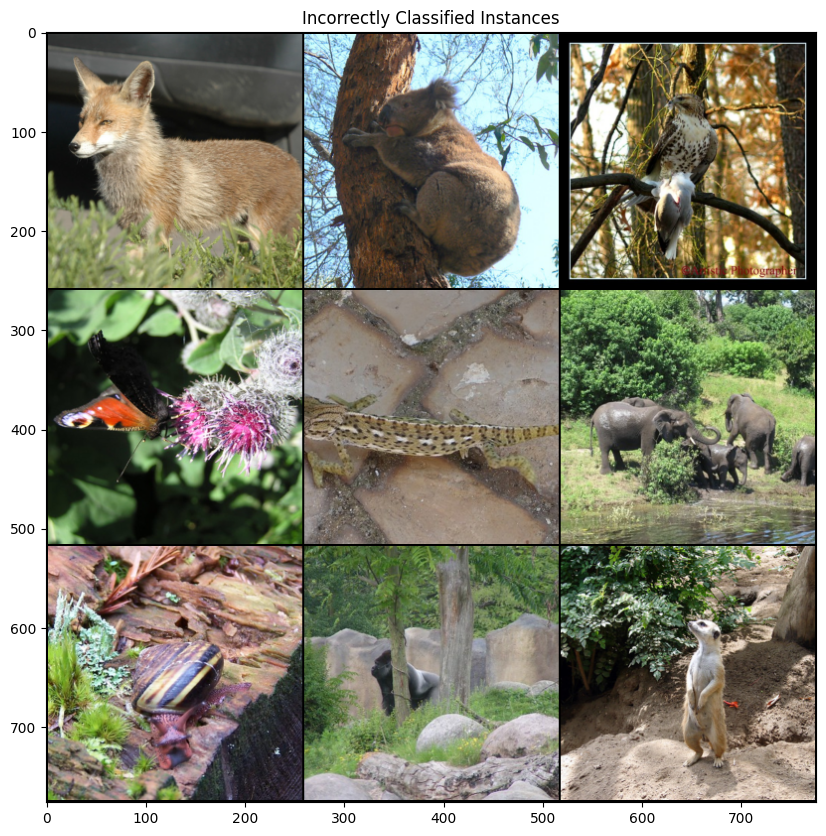

In [31]:
# Run once your have trained your final model
check_accuracy(loader_test, model, analysis=True)

___

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.1: Hyperparameter Search:


**Answer:**

I did a random hyperparameter space search first to find the rough range in which i should then do my grid hyperparameter search.
The number of epochs used is lower to reduce the amount of time it takes to get the results. The initial search was done on learning rate, weight decay and alpha value for the CELU activation function. To find the best values, I created a dataframe of the hyperparameter values, training loss, validation loss and validation accuracy. I also plotted the hyperparameter values individually against validation accuracy to see if there is any overall correlation. I saw that the alpha value showed no clear correlation so I decided to leave this at the default value of 1. The learning rate was best around 0.002 and the weight decay around 5e-5.

After this, I had added a learning rate warmup and schedule, so I did another random hyperparameter search to find the best values for this. I left alpha=1 and searched for learning rate, weight decay and warmup length. The value range for learning rate and weight decay was based off the previous search and the range for warmup was based off initial manual testing. I once again plotted the parameters against validation accuracy and also added a correlation heatmap to more clearly find any trends. I saw that a lower warmup time resulted in a better accuracy and a learning rate around 0.003 is best. There was no clear winning value for weight decay so I left this around the value from the first search. So I did another grid search around these parameters, but from this latest grid search, I noticed that in general a higher learning rate resulted in better validation accuracy and lower validation loss, so I did a third grid search with a wider range of learning rates. 

From this final grid search, I decided to use a learning rate of 0.007 and warmup length of 200 as this gave the 2nd highest validation accuracy and lowest validation loss. It also had one of the less erratic training vs validation loss graphs.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.2: Engineering Decisions 

Detail which engineering decisions you made to boost the performance of the baseline results. Why do you think that they helped? (7 points)

**Answer:**


I tried different activation functions and settled on the CELU function since it is continuously differentiable and this can facilitate more efficent backpropogation. It also will enable neurons that would have otherwise stayed 'dead' with ReLU to 'recover' and contribute to the neural network again. It only adds one more hyperparameter. Its ability to produce negative values could perhaps make the model more expressive. The inclusion of the CELU activation function did marginally improve performance.

Adding other evaluation metrics helped in my decisions of what to change - I added precision, recall and f1 scores for each class so I could more easily see the proportion of false positives and false negatives.

I addressed the class imbalance in the data by upsampling the minority classes using a library called Albumentations which allowed me to apply realistic augmentations to the images. I noticed in the initial run that some classes were never predicted by the model and after checking the class distribution I noticed a sizable imbalance - (initial class imbalance: 
African elephant: 1371
Eurasiankingfisher: 732
Virginia deer: 835
brown bear: 548
chameleon: 747
dragonfly: 1224
giant panda: 1364
gorilla: 1111
hawk: 1207
king penguin: 956
koala: 1599
ladybug: 1415
lion: 891
meerkat: 1438
orangutan: 923
peacock: 916
red fox: 426
snail: 1018
tiger: 751
white rhinoceros: 512)

I intially assigned a minimum class size of 1000 for those under this threshold and create a new augmented train folder for the model to use. In addition to this, I take the new class balance figures and generate class weights for the cross entropy loss function to use. After this, I saw that there was an improvement in performance where the previously minority classes were being predicted now. However, I saw that in the classes with the worst performance in the confusion matrix, there was a high precision and low recall score, so the model was missing a lot of positive examples (high false negatives) but there was also few false negatives.
To remedy this, I then decided to downsample the majority classes so that all classes now have 1200 images in them. This slightly helped the performance of the model, increasing the recall score. I chose 1200 as a middle-ground between removing too many images and creating too many similar images.

By creating more examples of the majority classes, the models stands a far better chance of being able to learn the features for these classes, and this is reflected in the improved performance the fact that the previous minority classes are now predicted by the model. The class weights also help the performance of the model since there is still an imbalance between the new minimum class size of 1000 and the maximum class size of 1599 for koala, so providing this helps the model stop becoming biased towards the more frequently appearing classes by applying more importance to the errors made on the underrepresented classes.

The Adam optimisers already perform some learning rate decay, so it does not make sense to use Pytorch's learning rate schedulers to implement another decay.
Upon research online, I saw that the RAdam optimiser was widely reported to have improved people's model performance. I found that RAdam didn't improve performance despite the reported increased robustness for deep networks. The authors of this paper [https://arxiv.org/pdf/1910.04209.pdf] say that it the warmup part of RAdam is the main part that helps and recommend using normal Adam with a warmup, so this triggered me to look into learning rate warmup.

The pytorch_warmup library implements this, however a learning rate scheduler is also needed for the warmup to work, so I experimented with various learning rate schedulers too. The authors of that paper recommend trying a warmup of $\frac{2}{1-\beta_2}$, so this is what I started with. The main reason for warmup steps is to allow adaptive optimisers, like Adam, to compute correct statistics of the gradients. The model can otherwise suffer from a sort of 'early over-fitting'. The learning rate scheduler reducing the learning rate over time lets the model take smaller steps as the training goes on, which is beneficial as you perform gradient descent. The inclusion of warmup and a learning rate scheduler also boosted performance. I tried multiple learning rate schedulers including reduce on plateau, cosineannealingwarmrestarts and lambdalr, but settled on cosineannealinglr. I also tried multiple warmup iterations, starting with the 2000 thats suggested in the paper but found that to be too long, so I initally tried 4,6 and 10 epochs and found 4 epochs to work best for me. I then ran a random hyperparameter search including warmup length (I talked about this in Q2.1).

Implementing early stopping helped prevent overfitting by looking at the validation loss - if there is no improvement in this after a certain number of epochs, then the model stops training.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.3: Out of distribution evaluation

Lets see how your trained model performs when evaluated on cartoons of the 20 animal classes. Do not try and modify your model to perform well on this task, this is just a reflective exercise. How did your model perform at the task? Why do you think this was the case? Detail one method which you expect would improve model performance. (2 points)

In [240]:
ON_COLAB = False

!wget 'https://zenodo.org/records/10424022/files/cartoons.zip?download=1'

if ON_COLAB:
    !unzip /content/cartoons.zip?download=1 > /dev/null

else:
    !unzip cartoons.zip?download=1 > /dev/null

--2024-02-01 16:43:11--  https://zenodo.org/records/10424022/files/cartoons.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.79.172, 188.184.103.159, 188.184.98.238
Connecting to zenodo.org (zenodo.org)|188.185.79.172|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1737267 (1.7M) [application/octet-stream]
Saving to: ‘cartoons.zip?download=1’

cartoons.zip?downlo 100%[===================>]   1.66M  9.05MB/s    in 0.2s    

2024-02-01 16:43:11 (9.05 MB/s) - ‘cartoons.zip?download=1’ saved [1737267/1737267]



In [27]:
mean = torch.Tensor([0.485, 0.456, 0.406])  # assuming same dist as imagenet
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean.tolist(), std.tolist()),
    ]
)
cartoon_path = ("/content/" if ON_COLAB else "") + "cartoons"


cartoon_dataset = datasets.ImageFolder(cartoon_path, transform=transform)

print(len(cartoon_dataset))

batch_size = 128

cartoon_loader = DataLoader(
    cartoon_dataset, batch_size=batch_size, shuffle=True, num_workers=2
)

400


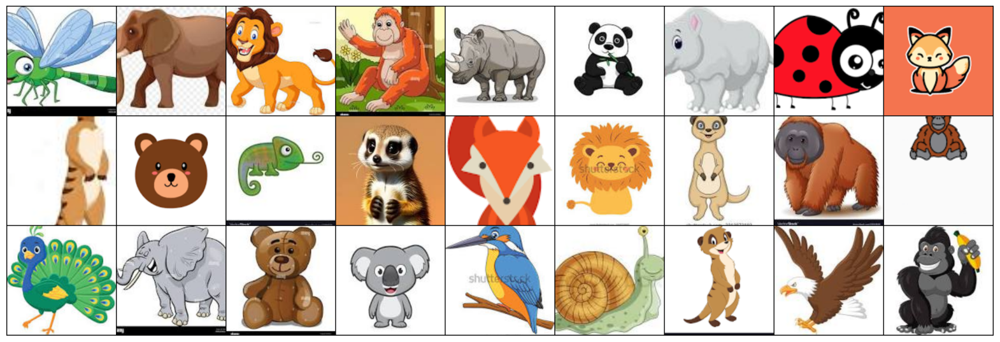

In [242]:
sample_inputs, _ = next(iter(cartoon_loader))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(
    denorm(fixed_input),
    nrow=9,
    padding=2,
    normalize=False,
    value_range=None,
    scale_each=False,
    pad_value=0,
)

plt.figure(figsize=(20, 10))
plt.axis("off")
show(img)

Got 145 / 400 correct of val set (36.25)
Avg val loss:  4.203446745872498
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


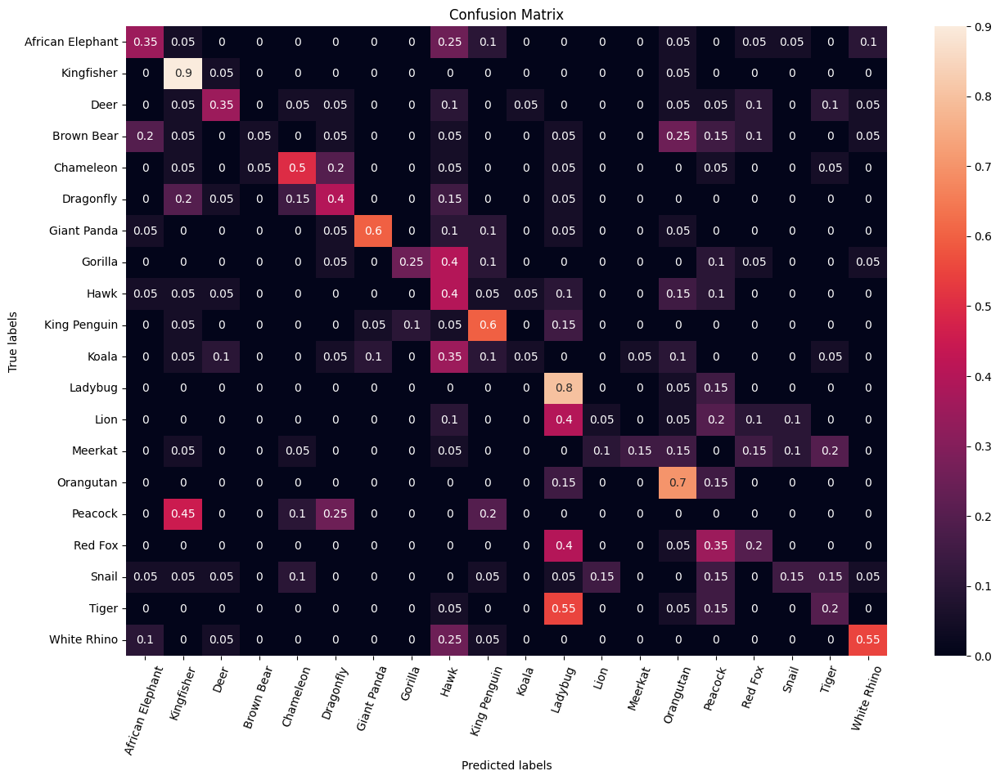

              labels  precision  recall        f1
0   African Elephant   0.437500    0.35  0.388889
1         Kingfisher   0.450000    0.90  0.600000
2               Deer   0.500000    0.35  0.411765
3         Brown Bear   0.500000    0.05  0.090909
4          Chameleon   0.526316    0.50  0.512821
5          Dragonfly   0.363636    0.40  0.380952
6        Giant Panda   0.800000    0.60  0.685714
7            Gorilla   0.714286    0.25  0.370370
8               Hawk   0.170213    0.40  0.238806
9       King Penguin   0.444444    0.60  0.510638
10             Koala   0.333333    0.05  0.086957
11           Ladybug   0.285714    0.80  0.421053
12              Lion   0.166667    0.05  0.076923
13           Meerkat   0.750000    0.15  0.250000
14         Orangutan   0.400000    0.70  0.509091
15           Peacock   0.000000    0.00       NaN
16           Red Fox   0.266667    0.20  0.228571
17             Snail   0.375000    0.15  0.214286
18             Tiger   0.266667    0.20  0.228571


/var/folders/4q/9v2wk3r55hl8qk2pnsrbd1vc0000gn/T/ipykernel_15358/3545525839.py:55: RuntimeWarning: invalid value encountered in scalar divide
  f1 = [2*(precision[i]*recall[i])/(precision[i]+recall[i]) for i in range(len(labels))]


(0.3625, 4.203446745872498)

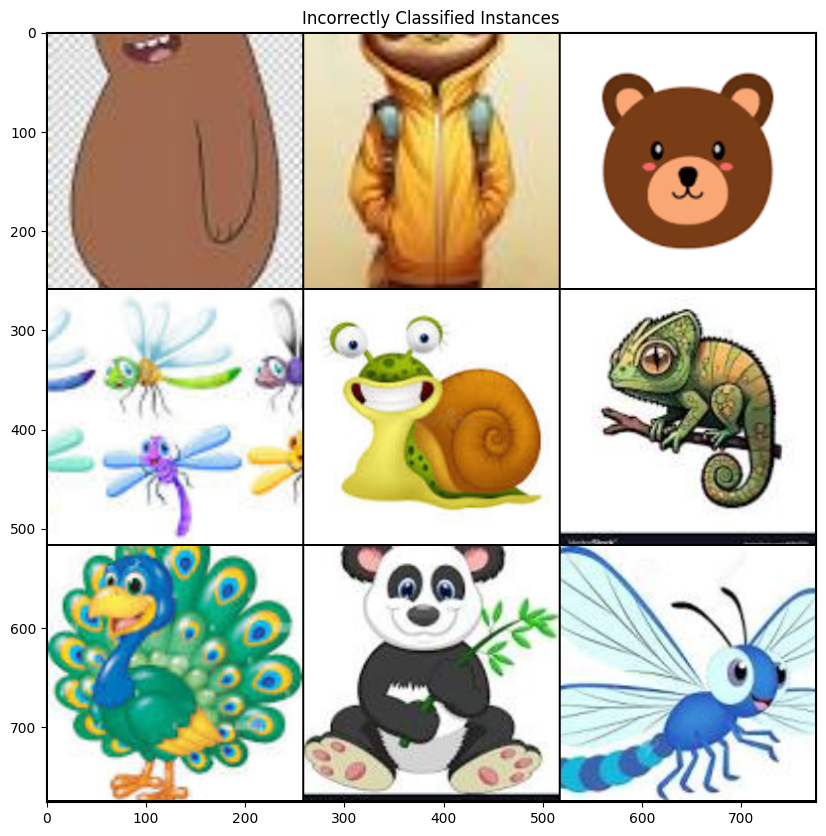

In [28]:
check_accuracy(cartoon_loader, model, analysis=True)

**Answer:**

The model performed worse on the cartoons. This could be for a number of reasons; the features needed for the cartoons are different to the real-world images - the features are usually exaggerated or simplified so the model won't be able to pick out the features it needs to. The shapes of the cartoons also vary a lot compared to the actual animals, again affecting the model's capability to classify the images.

One method that could improve performance is including cartoon images in the training dataset so the model has a chance to learn the features it needs to pick out for cartoons. Including the cartoon versions of the animals as a different class may be beneficial in model performance if it is having trouble classifying the animals correctly (as the features between the actual animal and the cartoon version will likely vary).

There were a few notable exceptions for well predicted classes, such as ladybug and kingfisher. After looking at the NaturalImageNet and cartoon images for these 2 classes, I saw that they appear similarly in these datasets, which would explain why the model is able to identify them. Looking at the koala classes, it is clear to see why these were not predicted correctly at all for cartoons; they look very different in the cartoons compared to real life, with exaggerated/simplifed features as mentioned earlier. 

<!-- END QUESTION -->

## Part 3 (10 points)

The code provided below will allow you to visualise the feature maps computed by different layers of your network. Run the code (install matplotlib if necessary) and  

**answer the following questions**:

<!-- BEGIN QUESTION -->

### Q3.1 : Learned Features

Compare the feature maps from low-level layers to high-level layers, what do you observe? (4 points)

**Answer:**

The lower level layers, like layer1 and conv1, are picking out a lot of the more obvious and visual features like edges and colours. As you progress down, the feature maps become more abstract as the model combines the more basic features from the earlier layers. The 'squares' visible are increasing in size due to the operations happening as you progress through the layers; strided convolutions and max pooling in ResNet downsamples, reducing the resolution (the max pooling picks out the most dominant features). This also allows the model to pick out more global features compared to early layers which are looking at more detail. The highest level layers, eg. layer 6, give the highest level features and it is not visually possible to see what features the model is seeing here. It is now looking more at the actual contents of the image rather than locality. So, early feature maps look at more basic features like edges, colours and textures and as you progress, the maps become more abstract and less spatially detailed.

In the earlier channels, there is similarities in the feature maps but in the deeper layers, all of the channels are picking up different features; there is no repetition or dead activations (which may have been the case with ReLU) in the channels seen. 

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.2: Performance Analysis

Use the training log, reported test set accuracy and the feature maps, analyse the performance of your network. If you think the performance is sufficiently good, explain why; if not, what might be the problem and how can you improve the performance? (4 points)

**Answer:**

The performance is significantly better than the initial run that had an accuracy of 37.44%. The improved version has an accuracy of over double that, but there is still room for improvement, for example, snails and red foxes are predicted particularly poorly by the model. Having said this, there is now no longer large discrepancies in precision and recall, but now using the f1 score to identify the worst performing classes could be used to make improvements. Trying more architecture changes may also improve performance, like adding/removing residual blocks. Adding more examples of the worst performing classes in the training data (through mutations or finding new pictures) could help. 

The model performed slightly worse on the test compared to the validation set, so there is likely still some overfitting to the test data - reducing the number of epochs with no improvement before early stopping could help here. Red foxes in particular were predicted much more accurately in the validation set compared to the test set; this could just be due to chance with the split of the training/validation/test data, perhaps there could a distribution shift between the test and training/validation data from the split. Overfitting could also play a role here. Looking at the feature maps for snails, the shell tends to be the feature picked out by the earlier layers, but the later layers seem to lose track of it as the resolution decreases.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.3: Alternative Evaluations

What are the other possible ways to analyse the performance of your network? (2 points)

**Answer:**

Using precision, recall and the f1 score more could have helped with improvements.
AUC-ROC is an another metric that could be used as it shows the model's ability to distinguish between classes across all potential thresholds. Using it in a one-vs-all way effective changes the problem to a binary classification evaluation which could make it easier to see the performance of each class in context.

---

<!-- END QUESTION -->

**Feature Visualization**

The code below will visualize the features of your network layers (you may need to modify the layer names if you made changes to your architecture). 

If you change the plotting code, please ensure it still exports correctly when running the submission cell.

In [56]:
import matplotlib.pyplot as plt


def plot_model_features():
    fig = plt.tight_layout()
    activation = {}

    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()

        return hook

    vis_labels = ["conv1", "layer1", "layer2", "layer3", "layer4", "layer5", "layer6"]

    for l in vis_labels:
        getattr(model, l).register_forward_hook(get_activation(l))

    data, _ = test_dataset[1790]
    data = data.unsqueeze_(0).to(device=device, dtype=dtype)
    output = model(data)

    for idx, l in enumerate(vis_labels):
        act = activation[l].squeeze()

        # only showing the first 16 channels
        ncols, nrows = 8, 2

        fig, axarr = plt.subplots(nrows, ncols, figsize=(15, 5))
        fig.suptitle(l)

        count = 0
        for i in range(nrows):
            for j in range(ncols):
                axarr[i, j].imshow(act[count].cpu())
                axarr[i, j].axis("off")
                count += 1

<!-- BEGIN QUESTION -->



<Figure size 640x480 with 0 Axes>

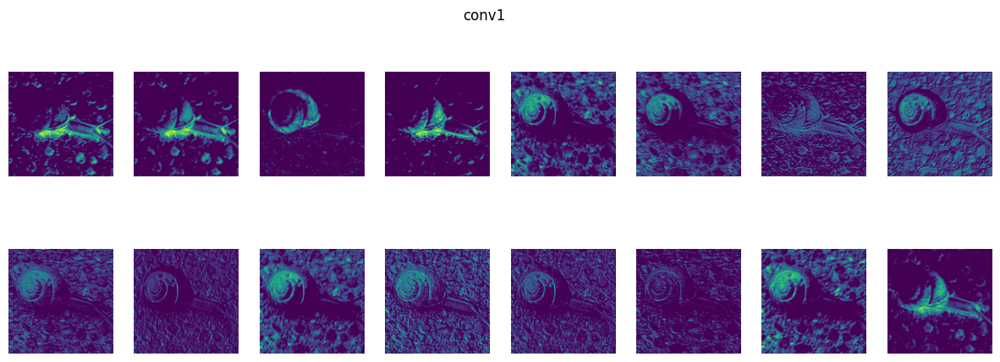

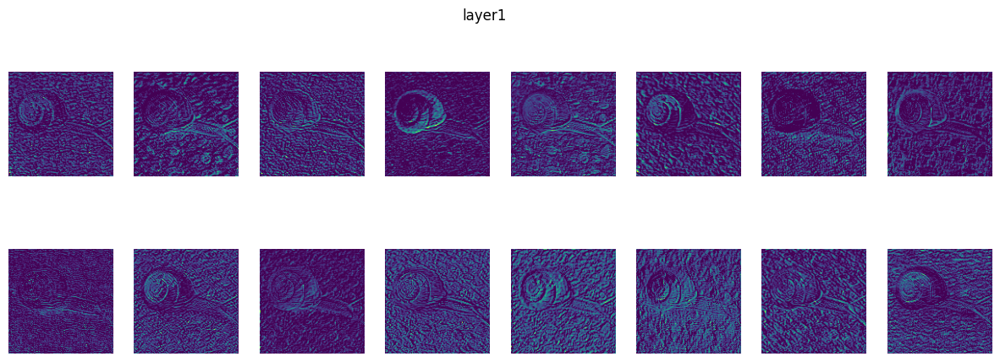

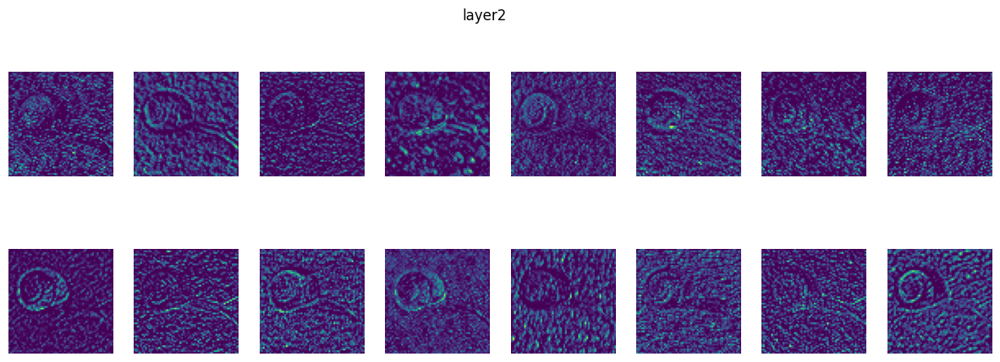

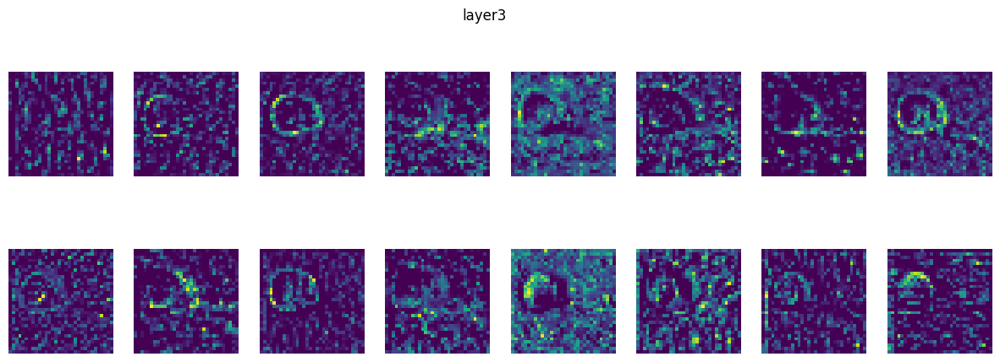

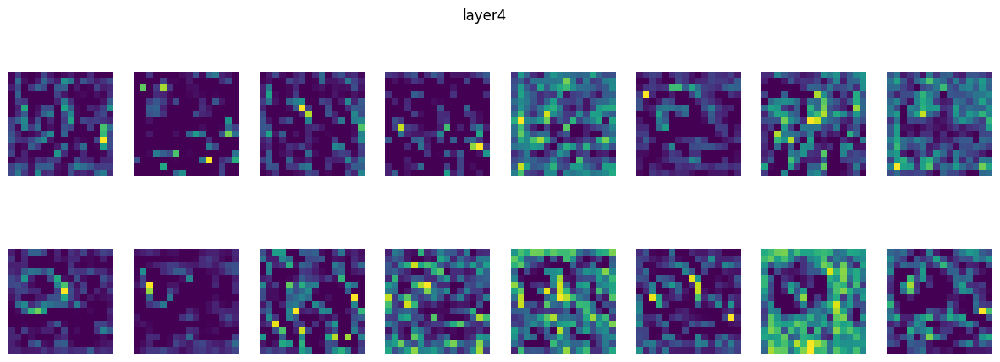

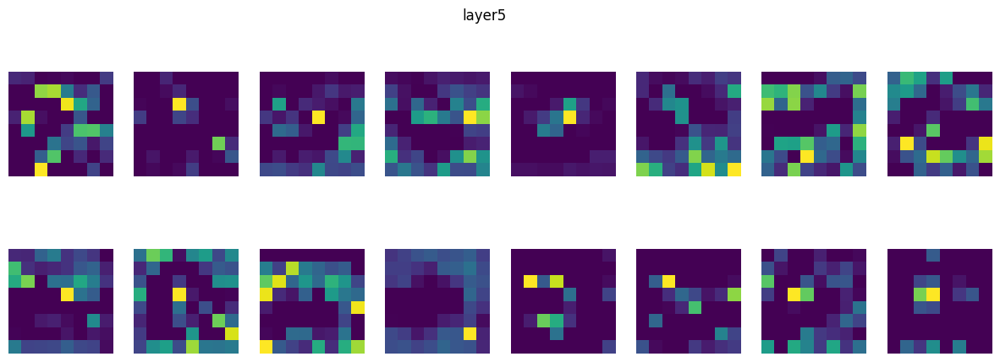

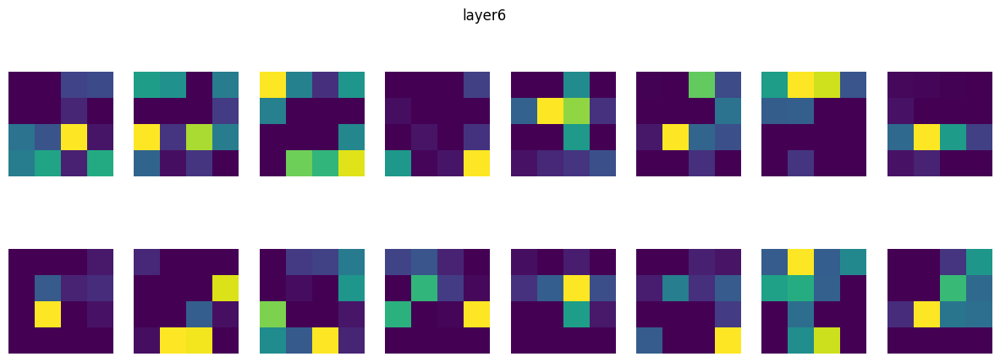

In [57]:
# Visualize the figure here, so it is exported nicely
plot_model_features()

<!-- END QUESTION -->

## Submission
Git push your finalized version of this notebook (with saved outputs) to the gitlab repo which you were assigned. You should request our tests once and check that the ```preview.pdf```:
* Passes all public tests (these are the same ones provided / embedded in the notebook itself)
* Contains your qualitative answers
* Contains your figures (confusion matrix and network features)

---

To double-check your work, the cell below will rerun all of the autograder tests.

In [78]:
grader.check_all()

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed